In [67]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
import datetime
import glob
import netCDF4
import xarray as xr
import pandas as pd
import seaborn as sns
plt.style.use('seaborn')

C:\Users\pkoll\AppData\Local\Temp\ipykernel_7232\4031092812.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


In [68]:
#### MIGHTI ####
L1m_fns = glob.glob('/disks/data/icon/Repository/Archive/LEVEL.1/MIGHTI-A/2020/002/Data/ICON_L1_MIGHTI-A_Science_2020-01-02_03????_v03r001.NC')
L1m_fns.sort()

#### FUV ####
L1f_fn = 'ICON_L1_FUV_SWP_2020-01-02_v05r001.NC'

#LOADING IN THE DATA
dsf_raw = xr.open_dataset(L1f_fn,engine = 'netcdf4')
dsf_raw


<xarray.Dataset>
Dimensions:                            (Epoch: 5745, Rows: 256, Stripes: 6)
Coordinates:
  * Epoch                              (Epoch) float64 1.578e+12 ... 1.578e+12
  * Rows                               (Rows) float32 0.0 1.0 ... 254.0 255.0
Dimensions without coordinates: Stripes
Data variables: (12/52)
    ICON_L1_FUVA_SWP_Start_Times       (Epoch) object ...
    ICON_L1_FUVA_SWP_Stop_Times        (Epoch) object ...
    ICON_L1_FUVA_SWP_Center_Times      (Epoch) object ...
    ICON_L1_FUVA_SWP_Integration_Time  (Epoch) float32 ...
    ICON_L1_FUVA_SWP_Chain_ID          (Epoch) float32 ...
    ICON_L1_FUVA_SWP_Quality_Flag      (Epoch) float32 ...
    ...                                 ...
    ICON_L1_FUVA_SWP_PROF_M3_CLEAN     (Epoch, Rows) float32 ...
    ICON_L1_FUVA_SWP_PROF_P0_CLEAN     (Epoch, Rows) float32 ...
    ICON_L1_FUVA_SWP_PROF_P3_CLEAN     (Epoch, Rows) float32 ...
    ICON_L1_FUVA_SWP_PROF_P6_CLEAN     (Epoch, Rows) float32 ...
    ICON_L1_FUVA_SWP_GAIN_DAY          (Stripes) float32 ...
    ICON_L1_FUVA_SWP_GAIN_NIGHT        (Stripes) float32 ...
Attributes: (12/51)
    Acknowledgement:             This is a data product from the NASA Ionosph...
    ADID_Ref:                    NASA Contract > NNG12F45C
    Calibration_File:            See calibration files in general attribute f...
    Conventions:                 SPDF ISTP/IACF Modified for NetCDF (v0.8)
    Data_Level:                  L1
    Data_Type:                   APIDxE3 > ICON Application ID 0xE3: FUV Scie...
    ...                          ...
    FLATFIELD_CORRECTION:        [1.159 1.057 1.011 0.952 0.919 0.91 ]
    BACKGROUND_CORRECTION:       BKG/ICON_L1_FUV_Calibration-Background-SW_20...
    RAYLEIGH_CONVERSION:         [0.04132972 0.04132972 0.04132972 ... 0.0413...
    File_Date:                   Thu, 11 May 2023, 2023-05-11T20:23:20.071 UTC
    Generation_Date:             20230511
    Software_Version:            ICON SDC > ICON FUV L1 Processor version 202...

In [ ]:
# ORIGINAL DATA ANALYSIS WAS DONE WITH P0- the FOURTH STRIPE (out of 6). Now let's try using the other stripes.
# p0, p3, p6, m9, m6, m3

In [3]:
L1f_fn_01 = 'ICON_L1_FUV_SWP_2020-01-01_v05r000.NC'
#L1f_fn_02 = 'ICON_L1_FUV_SWP_2020-01-02_v05r001.NC'
#L1f_fn_03 = 'ICON_L1_FUV_SWP_2020-01-03_v05r000.NC'
#L1f_fn_04 = 'ICON_L1_FUV_SWP_2020-01-04_v05r000.NC'
#L1f_fn_18 = 'ICON_L1_FUV_SWP_2020-01-18_v05r000.NC'

In [4]:
# Downselect the data to only include the variables we are concerned with.
# For now just use the 4th stripe (out of 6, labeled P0), and just use time and the calibrated brightness 

def data_opening(d):
    dsf_raw = xr.open_dataset(d,engine = 'netcdf4')
    dsf = dsf_raw[['ICON_L1_FUVA_SWP_Center_Times','ICON_L1_FUVA_SWP_PROF_P0']]
    # Convert times to something Python and xarray can understand, and reindex the dataset by time instead of the obscure "Epoch"
    t = pd.to_datetime(dsf.ICON_L1_FUVA_SWP_Center_Times.values)
    dsf['time'] = (['Epoch'], t)
    dsf = dsf.swap_dims({'Epoch':'time'})
    dsf = dsf.rename({'Rows':'row'})
    # Rename and drop useless variables
    dsf['I_1356'] = dsf['ICON_L1_FUVA_SWP_PROF_P0']
    dsf = dsf.drop(['ICON_L1_FUVA_SWP_PROF_P0','ICON_L1_FUVA_SWP_Center_Times','Epoch'])
    return dsf

In [5]:
df_01 = data_opening(L1f_fn_01)
#df_02 = data_opening(L1f_fn_02)
#df_03 = data_opening(L1f_fn_03)
#df_04 = data_opening(L1f_fn_04)
#df_18 = data_opening(L1f_fn_18)

In [6]:
# Trying Different Days on Different Seasons around the year: SPR
L1f_fn_322 = 'ICON_L1_FUV_SWP_2020-03-22_v05r000.NC'
L1f_fn_419 = 'ICON_L1_FUV_SWP_2020-04-19_v05r000.NC'
L1f_fn_510 = 'ICON_L1_FUV_SWP_2020-05-10_v05r000.NC'

df_322 = data_opening(L1f_fn_322)
df_419 = data_opening(L1f_fn_419)
df_510 = data_opening(L1f_fn_510)

In [6]:
def wave_peaks_tdf(df,r):
    df_plt = df.isel(row = r)
    plt.figure()
    plt.title('Data')
    plt.plot(df_plt.time, df_plt.I_1356, 'C3.-') 
    plt.show()
    
    from scipy.signal import find_peaks
    data = df.I_1356.isel(row = r)
    data_np = data.to_numpy()
    np.shape(data)
    
    max_data = max(data_np)
    time_diff = datetime.timedelta(minutes=19, hours=1) 

    
    indices = find_peaks(data, height = max_data * (4/6), distance = 100) 
    
    indexes = indices[0]
    #print(indexes)
    final_indexes = []
    
    for i in range(0,len(indexes)-1):
        if len(indexes) > 15:
            if indexes[i+1] - indexes[i] < 200:
                pass
            else:
                final_indexes.append(indexes[i])
        else:
            final_indexes.append(indexes[i])
    final_indexes.append(indexes[-1])
    #print(final_indexes)
    
    times_np = df_plt.time.to_numpy()
    
    times = []
    vals_at_times = []
#     for i in final_indexes: 
#         times.append(times_np[i])
#         vals_at_times.append(data[i])
#     #print(times,vals_at_times)
    
#     df_rows = df.append(row = r)
        
#     df_plt = df.isel(row = r)
#     plt.figure()
#     plt.title('Peaks')
#     plt.plot(df_plt.time, df_plt.I_1356, 'C3.-') 

#     for i in range(0,len(times)):
#         plt.plot(times[i],vals_at_times[i],'ro', markersize = 5)
#     plt.show()
    
    return vals_at_times
  

<IPython.core.display.Javascript object>


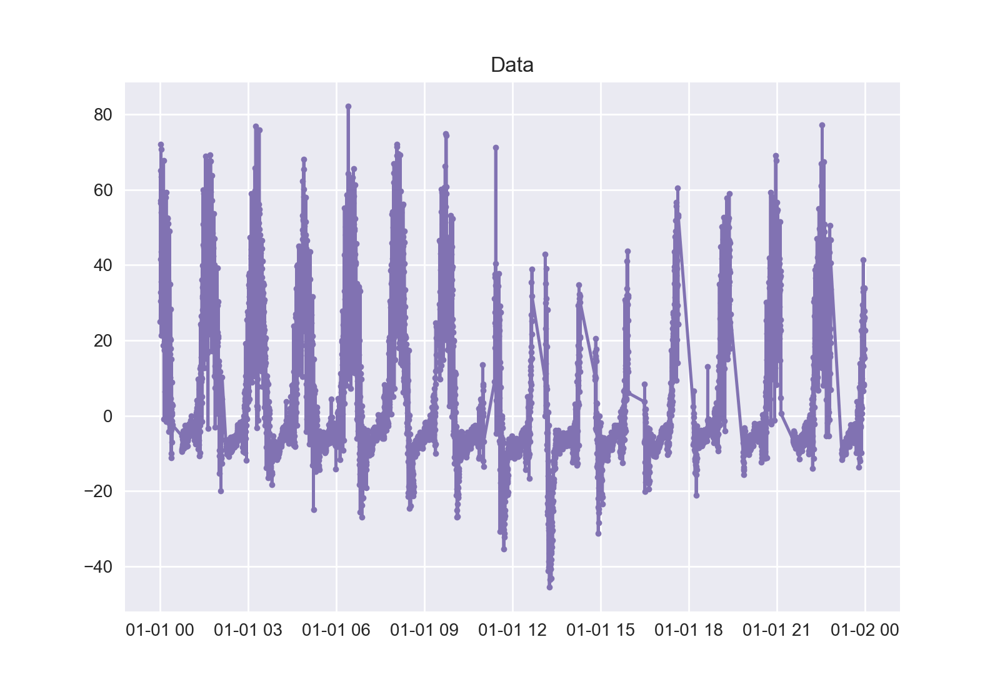

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>


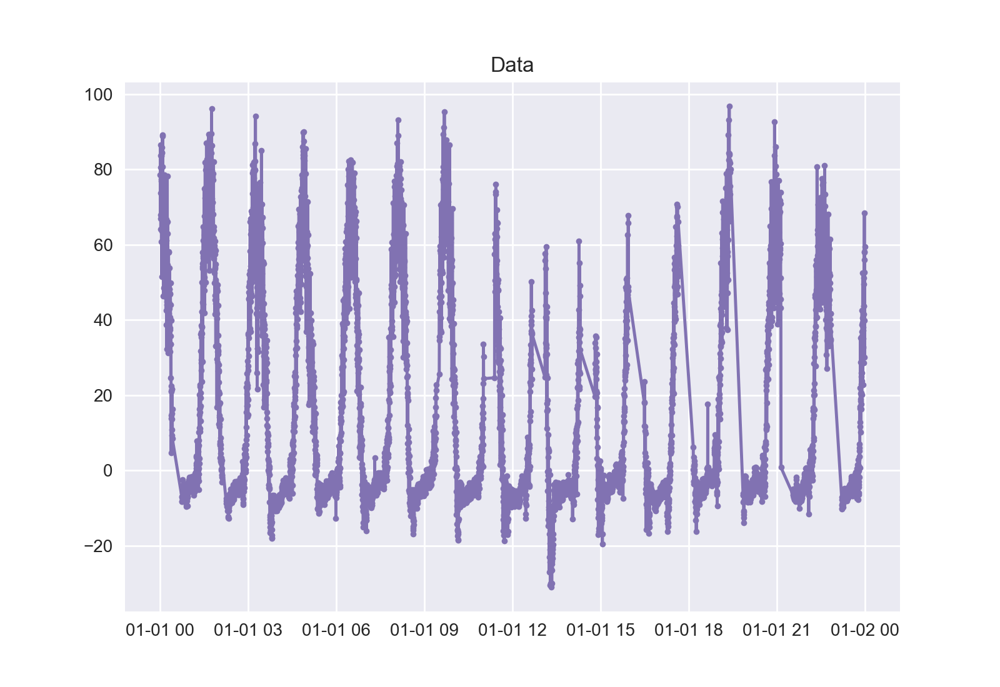

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>


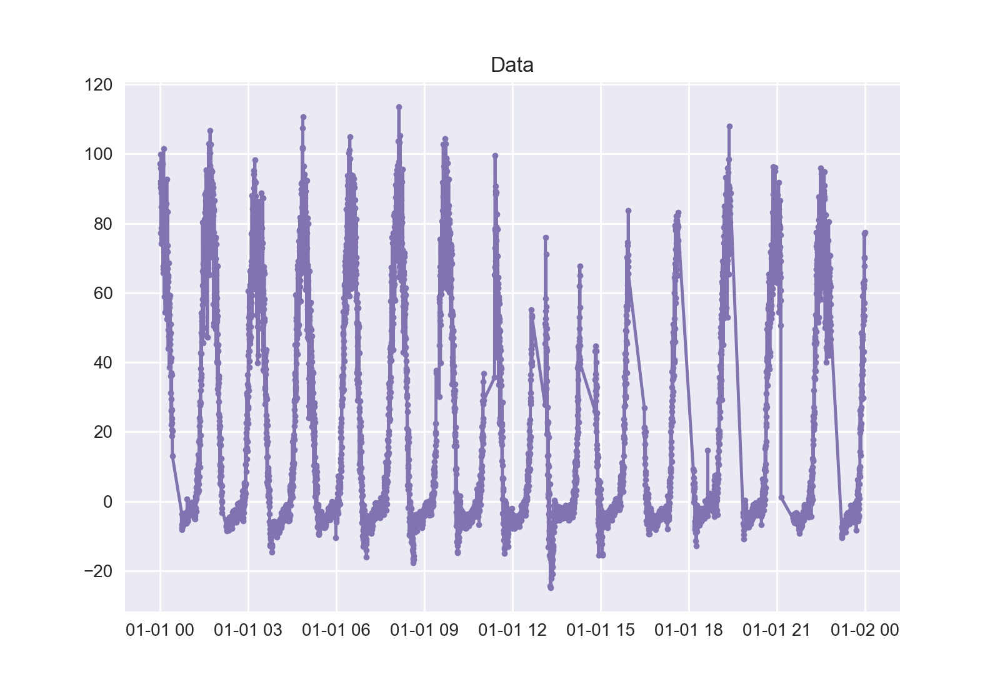

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>


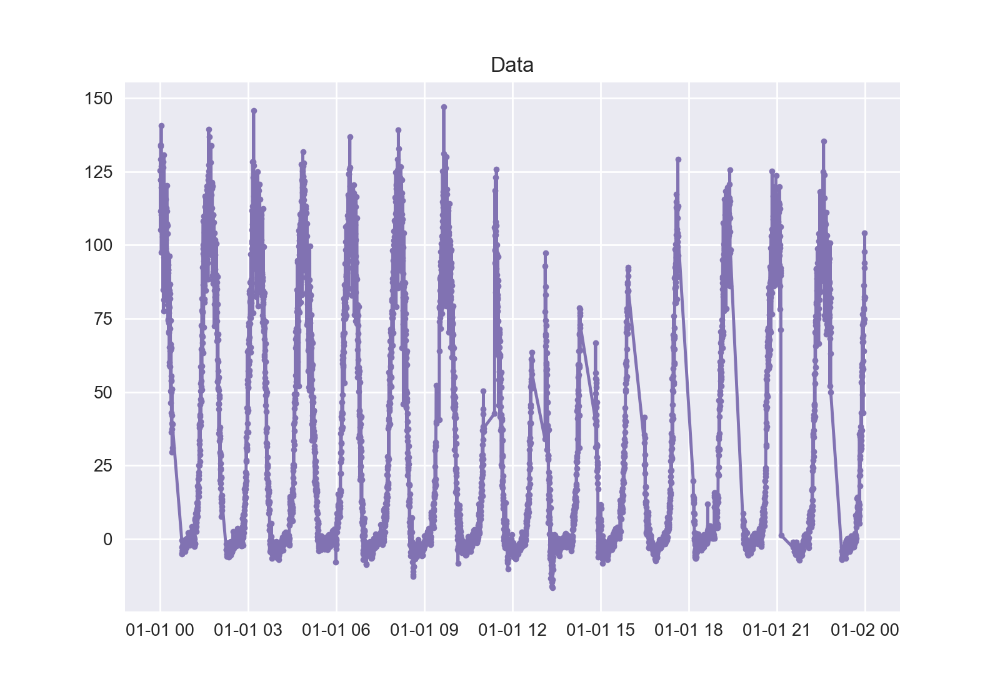

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>


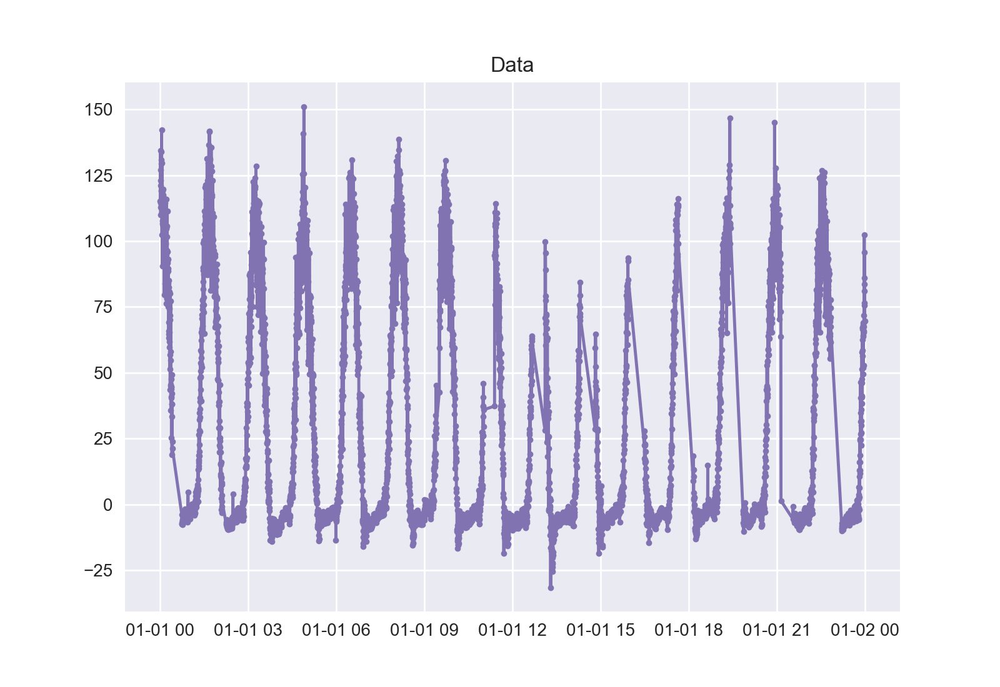

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>


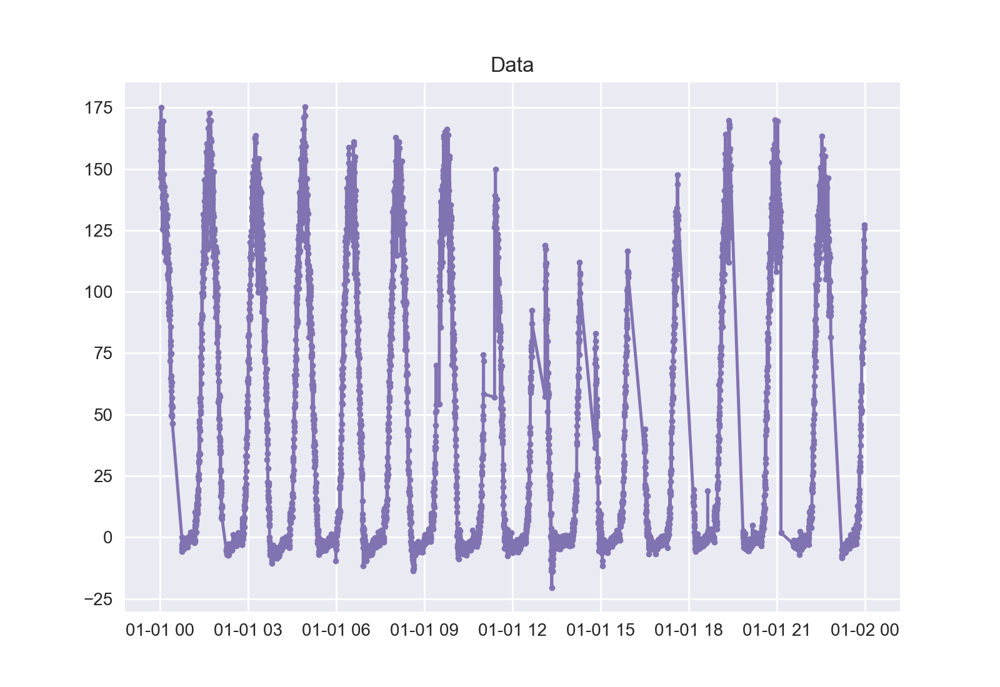

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>


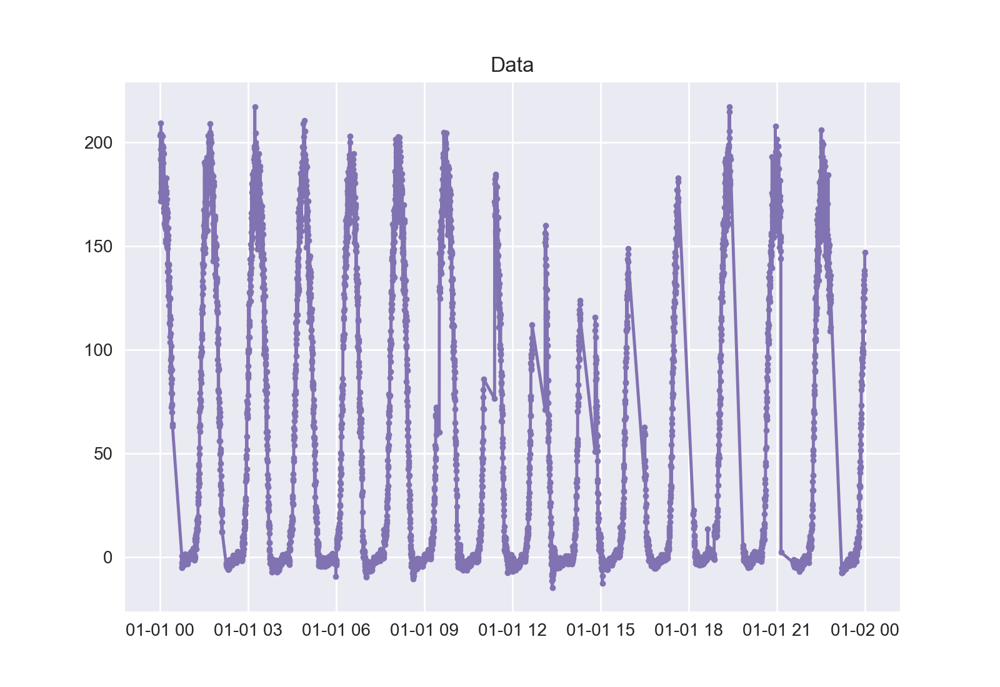

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>


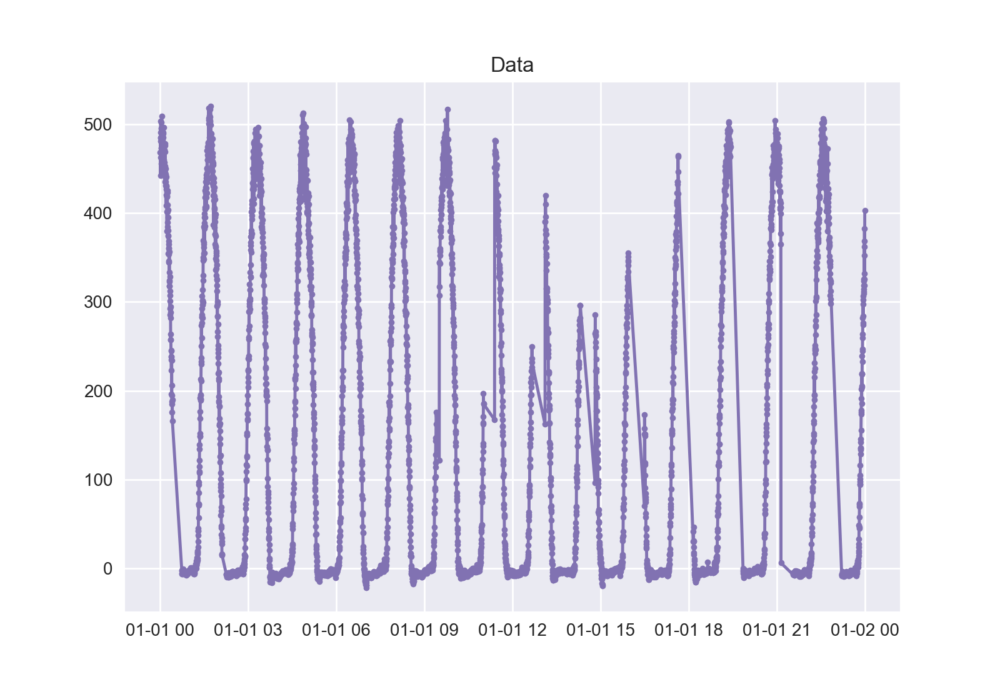

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>


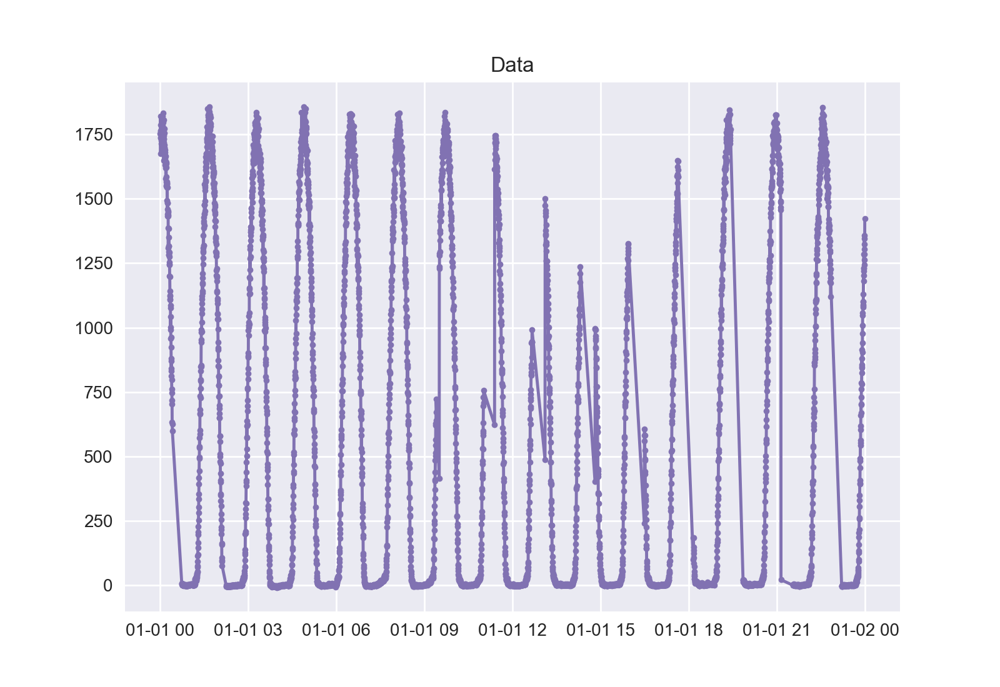

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>


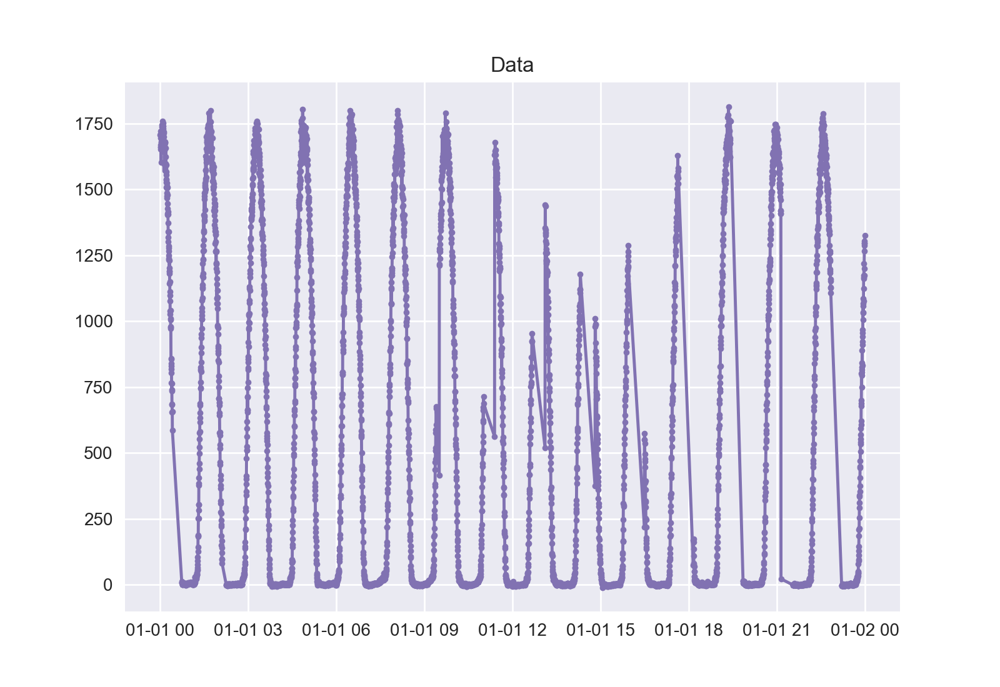

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>


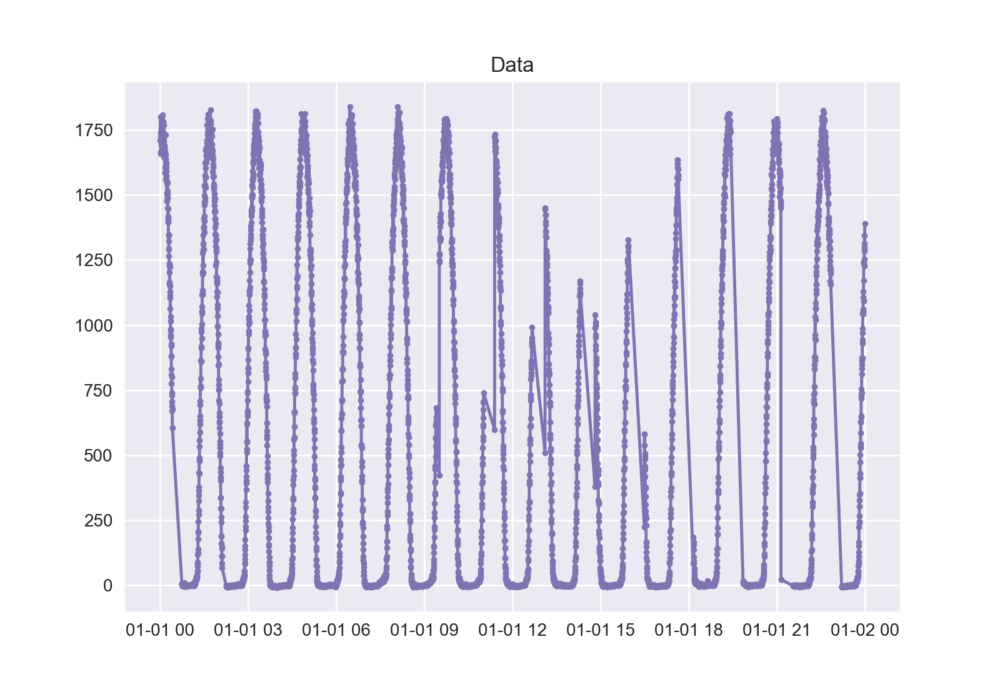

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))
C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\1695783392.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


<IPython.core.display.Javascript object>

C:\Users\pkoll\AppData\Local\Temp\ipykernel_14664\2439798489.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_rows.append(wave_peaks_tdf(df_01,i))


KeyboardInterrupt: 

In [8]:
df_rows = pd.DataFrame()
for i in range(0,len(df_01.I_1356.isel())):
    df_rows.append(wave_peaks_tdf(df_01,i))

In [ ]:
df_rows

In [7]:
def orbits_finder(df):
    #r = 148
    from scipy.signal import find_peaks
    data = df.I_1356.mean(dim = 'row')
    data_np = data.to_numpy()
    np.shape(data)

    max_data = max(data_np)
    time_diff = pd.to_timedelta('75 m')
    half_time_diff = pd.to_timedelta('50 m')

    indices = find_peaks(data, height = max_data * (4/6)) 

    indexes = indices[0]
    indexes 

    final_indexes = []

    for i in range(0,len(indexes)-1):
        if len(indexes) > 15:
            if indexes[i+1] - indexes[i] < 200:
                pass
            else:
                final_indexes.append(indexes[i])
        else:
            final_indexes.append(indexes[i])
    final_indexes.append(indexes[-1])
    
    times_np = df.time.to_numpy()
    times_dt = pd.to_datetime(times_np)
    
    all_orbits = []
    for i in final_indexes:
        start_time = times_dt[i] - half_time_diff
        end_time = start_time + time_diff
        df_orbit = df.sel(time=slice(start_time, end_time))
        all_orbits.append(df_orbit)
        
    return all_orbits

In [ ]:
len(df_01.I_1356.isel())

In [8]:
def single_orb_plotter(orbit_arr,n):
    orb = orbit_arr[n].mean(dim = 'row')
    plt_title = 'Orbit ' + str(n)
    
    plt.figure()
    plt.title(plt_title)
    plt.plot(orb.time, orb.I_1356, 'C3.-') 
    plt.show()
        

In [9]:
def single_orb(orbit_arr,n):
    orb = orbit_arr[n].mean(dim = 'row')
    t = orb.time
    val = orb.I_1356
    return(t, val)

In [10]:
def fuv_plots_smoothed(orbit_data):
    dsf_plot = orbit_data.rolling(row=7, center=True).mean()
    orbit_data['I_1356_filt'] = orbit_data['I_1356'] - orbit_data['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)
    # save the mean (bg) and the pertubation separately to see if it's affecting anything
    plt.figure(figsize=(10,3))

    # FUV
    vm = abs(orbit_data.I_1356_filt).quantile(0.95) # Choose max of colorbar (i.e., contrast)
    plt.pcolormesh(pd.to_datetime(orbit_data.time.values), orbit_data.row, orbit_data.I_1356_filt.T, cmap='plasma', vmin=-vm, vmax=vm)
    plt.ylabel('row')
    plt.colorbar(label='R')
    plt.title('FUV 1356 brightness')

    plt.gcf().autofmt_xdate()
    plt.tight_layout()
    

In [11]:
## Writing a function that will take in a day of data and output all of the individual orbit plots, and the fuv plots

def plotter(data):
    all_orbits = orbits_finder(data)
    total_len = len(all_orbits)
    
    for i in range(0,total_len):
        single_orb_plotter(all_orbits,i)
        fuv_plots_smoothed(all_orbits[i])

In [ ]:
# Trying to generate all orbit Subplots for a Specific Day
def subplot_gen(all_orbits):
    fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15) = plt.subplots(nrows=15, ncols=1, figsize = (8,35))
    plt.subplots_adjust(hspace=0.5)
    fig.tight_layout()
    #fig.suptitle("March 22nd, 2020", fontsize=18, y=0.95)

    ax1.plot(single_orb(all_orbits,0)[0],single_orb(all_orbits,0)[1], marker = '.')
    ax2.plot(single_orb(all_orbits,1)[0],single_orb(all_orbits,1)[1],marker = '.')
    ax3.plot(single_orb(all_orbits,2)[0],single_orb(all_orbits,2)[1],marker = '.')
    ax4.plot(single_orb(all_orbits,3)[0],single_orb(all_orbits,3)[1],marker = '.')
    ax5.plot(single_orb(all_orbits,4)[0],single_orb(all_orbits,4)[1],marker = '.')
    ax6.plot(single_orb(all_orbits,5)[0],single_orb(all_orbits,5)[1],marker = '.')
    ax7.plot(single_orb(all_orbits,6)[0],single_orb(all_orbits,6)[1],marker = '.')
    ax8.plot(single_orb(all_orbits,7)[0],single_orb(all_orbits,7)[1],marker = '.')
    ax9.plot(single_orb(all_orbits,8)[0],single_orb(all_orbits,8)[1],marker = '.')
    ax10.plot(single_orb(all_orbits,9)[0],single_orb(all_orbits,9)[1],marker = '.')
    ax11.plot(single_orb(all_orbits,10)[0],single_orb(all_orbits,10)[1],marker = '.')
    ax12.plot(single_orb(all_orbits,11)[0],single_orb(all_orbits,11)[1],marker = '.')
    ax13.plot(single_orb(all_orbits,12)[0],single_orb(all_orbits,12)[1],marker = '.')
    ax14.plot(single_orb(all_orbits,13)[0],single_orb(all_orbits,13)[1],marker = '.')
    ax15.plot(single_orb(all_orbits,14)[0],single_orb(all_orbits,14)[1],marker = '.')

In [ ]:
plt.figure()
plt.plot(single_orb(all_orbits,1)[0],single_orb(all_orbits,1)[1],marker = '.', label = 'PO')
plt.legend()
plt.show()

## P3 (Stripe ?)

In [12]:
def data_opening_w_stripe(stripe,d):
    dsf_raw = xr.open_dataset(d,engine = 'netcdf4')
    dsf = dsf_raw[['ICON_L1_FUVA_SWP_Center_Times','ICON_L1_FUVA_SWP_PROF_'+str(stripe)]]
    # Convert times to something Python and xarray can understand, and reindex the dataset by time instead of the obscure "Epoch"
    t = pd.to_datetime(dsf.ICON_L1_FUVA_SWP_Center_Times.values)
    dsf['time'] = (['Epoch'], t)
    dsf = dsf.swap_dims({'Epoch':'time'})
    dsf = dsf.rename({'Rows':'row'})
    # Rename and drop useless variables
    dsf['I_1356'] = dsf['ICON_L1_FUVA_SWP_PROF_'+str(stripe)]
    dsf = dsf.drop(['ICON_L1_FUVA_SWP_PROF_'+str(stripe),'ICON_L1_FUVA_SWP_Center_Times','Epoch'])
    return dsf

In [ ]:
stripe = 'P3'

df_01_p3 = data_opening_w_stripe(stripe,L1f_fn_01)
df_02_p3 = data_opening_w_stripe(stripe,L1f_fn_02)
df_03_p3 = data_opening_w_stripe(stripe,L1f_fn_03)
df_04_p3 = data_opening_w_stripe(stripe,L1f_fn_04)
df_18_p3 = data_opening_w_stripe(stripe,L1f_fn_18)

L1f_fn_322 = 'ICON_L1_FUV_SWP_2020-03-22_v05r000.NC'
L1f_fn_419 = 'ICON_L1_FUV_SWP_2020-04-19_v05r000.NC'
L1f_fn_510 = 'ICON_L1_FUV_SWP_2020-05-10_v05r000.NC'

df_322_p3 = data_opening_w_stripe(stripe,L1f_fn_322)
df_419_p3 = data_opening_w_stripe(stripe,L1f_fns_419)
df_510_p3 = data_opening_w_stripe(stripe,L1f_fn_510)

## P6 (Stripe ?)

In [ ]:
stripe = 'P6'

df_01_p6 = data_opening_w_stripe(stripe,L1f_fn_01)
df_02_p6 = data_opening_w_stripe(stripe,L1f_fn_02)
df_03_p6 = data_opening_w_stripe(stripe,L1f_fn_03)
df_04_p6 = data_opening_w_stripe(stripe,L1f_fn_04)
df_18_p6 = data_opening_w_stripe(stripe,L1f_fn_18)

df_322_p6 = data_opening_w_stripe(stripe,L1f_fn_322)
df_419_p6 = data_opening_w_stripe(stripe,L1f_fn_419)
df_510_p6 = data_opening_w_stripe(stripe,L1f_fn_510)

In [ ]:
plotter(df_01_p6)

## M9 (Stripe ?)

In [ ]:
stripe = 'M9'

df_01_m9 = data_opening_w_stripe(stripe,L1f_fn_01)
df_02_m9 = data_opening_w_stripe(stripe,L1f_fn_02)
df_03_m9 = data_opening_w_stripe(stripe,L1f_fn_03)
df_04_m9 = data_opening_w_stripe(stripe,L1f_fn_04)
df_18_m9 = data_opening_w_stripe(stripe,L1f_fn_18)

df_322_m9 = data_opening_w_stripe(stripe,L1f_fn_322)
df_419_m9 = data_opening_w_stripe(stripe,L1f_fn_419)
df_510_m9 = data_opening_w_stripe(stripe,L1f_fn_510)

## M6 (Stripe ?)

In [ ]:
stripe = 'M6'

df_01_m6 = data_opening_w_stripe(stripe,L1f_fn_01)
df_02_m6 = data_opening_w_stripe(stripe,L1f_fn_02)
df_03_m6 = data_opening_w_stripe(stripe,L1f_fn_03)
df_04_m6 = data_opening_w_stripe(stripe,L1f_fn_04)
df_18_m6 = data_opening_w_stripe(stripe,L1f_fn_18)

df_322_m6 = data_opening_w_stripe(stripe,L1f_fn_322)
df_419_m6 = data_opening_w_stripe(stripe,L1f_fn_419)
df_510_m6 = data_opening_w_stripe(stripe,L1f_fn_510)

## M3 degrees (Stripe ?)

In [ ]:
stripe = 'M3'

df_01_m3 = data_opening_w_stripe(stripe,L1f_fn_01)
#df_02_m3 = data_opening_w_stripe(stripe,L1f_fn_02)
#df_03_m3 = data_opening_w_stripe(stripe,L1f_fn_03)
#df_04_m3 = data_opening_w_stripe(stripe,L1f_fn_04)
#df_18_m3 = data_opening_w_stripe(stripe,L1f_fn_18)

#df_322_m3 = data_opening_w_stripe(stripe,L1f_fn_322)
#df_419_m3 = data_opening_w_stripe(stripe,L1f_fn_419)
#df_510_m3 = data_opening_w_stripe(stripe,L1f_fn_510)

### ALL LINES

In [13]:
df_01_p3 = data_opening_w_stripe('P3',L1f_fn_01)
df_01_p6 = data_opening_w_stripe('P6',L1f_fn_01)
#df_01_p9 = data_opening_w_stripe('P9',L1f_fn_01)
df_01_m3 = data_opening_w_stripe('M3',L1f_fn_01)
df_01_m6 = data_opening_w_stripe('M6',L1f_fn_01)
df_01_m9 = data_opening_w_stripe('M9',L1f_fn_01)


<IPython.core.display.Javascript object>


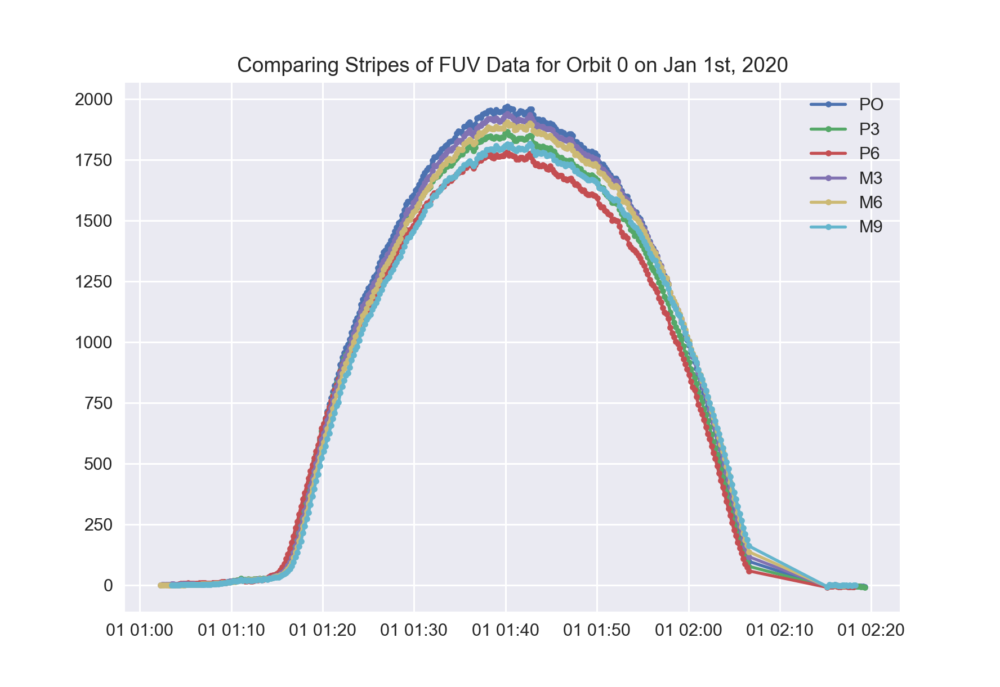

In [14]:
p_3_all_orbits = orbits_finder(df_01_p3)
p_6_all_orbits = orbits_finder(df_01_p6)
m_3_all_orbits = orbits_finder(df_01_m3)
m_6_all_orbits = orbits_finder(df_01_m6)
m_9_all_orbits = orbits_finder(df_01_m9)
p_0_all_orbits = orbits_finder(df_01)

        
plt.figure()
plt.title("Comparing Stripes of FUV Data for Orbit 0 on Jan 1st, 2020")
plt.plot(single_orb(p_0_all_orbits,1)[0],single_orb(p_0_all_orbits,1)[1],marker = '.', label = 'PO')
plt.plot(single_orb(p_3_all_orbits,1)[0],single_orb(p_3_all_orbits,1)[1],marker = '.', label = 'P3')
plt.plot(single_orb(p_6_all_orbits,1)[0],single_orb(p_6_all_orbits,1)[1],marker = '.', label = 'P6')
plt.plot(single_orb(m_3_all_orbits,1)[0],single_orb(m_3_all_orbits,1)[1],marker = '.', label = 'M3')
plt.plot(single_orb(m_6_all_orbits,1)[0],single_orb(m_6_all_orbits,1)[1],marker = '.', label = 'M6')
plt.plot(single_orb(m_9_all_orbits,1)[0],single_orb(m_9_all_orbits,1)[1],marker = '.', label = 'M9')


plt.legend()
plt.show()

## FUV FILTERING PLOTS

<IPython.core.display.Javascript object>


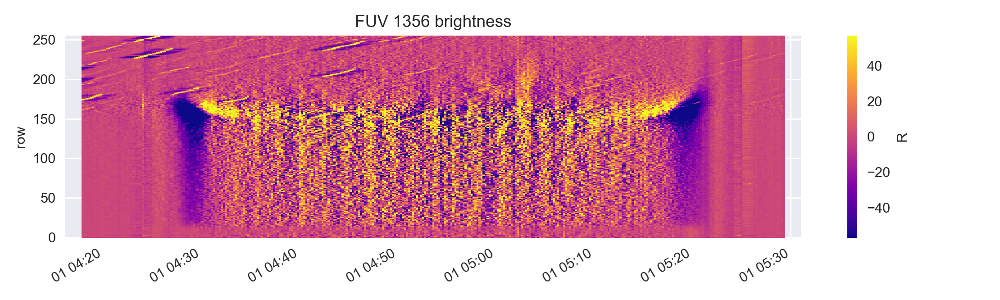

In [15]:
fuv_plots_smoothed(orbits_finder(df_01_p3)[3]) # cut rows at 125, and then average that for the data. 
#Plot w a hline 

# maybe select a smaller time increment (just focus on the daytime)

In [16]:
orbit_data_p3 = orbits_finder(df_01_p3)[0]

#dsf_plot_p3 = orbit_data_p3.rolling(row=7, center=True).mean()
orbit_data_p3['I_1356_filt'] = orbit_data_p3['I_1356'] - orbit_data_p3['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)
# save the mean (bg) and the pertubation separately to see if it's affecting anything

#plt.pcolormesh(pd.to_datetime(orbit_data.time.values), orbit_data.row, orbit_data.I_1356_filt.T, cmap='plasma', vmin=-vm, vmax=vm)

row_means_p3 = orbit_data_p3.mean(dim = 'row')
row_means_p3['I_1356_filt']

<xarray.DataArray 'I_1356_filt' (time: 122)>
array([         nan,          nan,          nan,          nan,
                nan,          nan,          nan,          nan,
        -4.9929304 ,  10.623996  ,  -5.3859158 ,  -4.4888706 ,
        -3.4182532 ,   0.557143  ,  -2.7550704 ,   8.508873  ,
        22.443163  ,   2.4870563 ,  -5.500203  ,  -3.7945182 ,
        -4.9699054 ,  -9.756578  ,   9.232681  ,  -5.93037   ,
         0.28623277,  -1.6749562 ,  11.944207  ,   5.684959  ,
         5.285682  ,  18.187586  ,  -7.8912725 ,  -7.979249  ,
        -2.925197  ,  -4.583464  ,  -6.179105  ,   3.6679192 ,
        31.063982  ,  13.893932  ,  -0.29663348,  -0.9796784 ,
         2.614207  ,  -2.102057  ,  -3.8922126 ,  -7.6690865 ,
        -9.051268  ,  -4.276087  ,   2.486557  ,  12.570501  ,
         3.713797  ,   7.1293955 ,   2.09954   ,   5.79145   ,
        -9.816517  ,  -2.3575902 ,   3.6477575 ,  -4.7031293 ,
        -6.594596  ,  -3.404895  ,  12.545788  ,   9.196737  ,
        14.292496  ,  -0.9857066 ,  -8.63702   ,  -5.1668706 ,
         3.583354  ,   1.2189121 ,   3.2953744 ,   3.6541271 ,
         8.3256855 ,   8.94961   ,   5.2610145 ,  19.715763  ,
        17.821161  ,  14.582409  ,  -1.171383  ,  -6.212714  ,
        -9.286279  ,  -9.525867  ,  -2.429346  ,   4.391885  ,
         5.51792   ,   1.9528619 ,   7.9786196 ,  13.622078  ,
        12.076285  ,   9.470228  ,  -0.2599988 , -10.093185  ,
        -2.9031856 ,  -7.0780296 ,   0.82259375,  -1.5776584 ,
        16.785267  ,  16.588835  ,  21.91001   ,  13.326425  ,
        -0.8280519 ,   5.330529  ,   3.2472992 ,  11.507511  ,
         1.9391743 ,  -6.0512123 ,  -5.3713703 ,   3.5746272 ,
         3.8255022 ,   0.7972684 ,   6.8946524 ,   1.4417399 ,
        -3.3917184 ,  -0.45165265,  -0.41016805,   1.6674328 ,
         3.9039788 ,   3.3834872 ,          nan,          nan,
                nan,          nan,          nan,          nan,
                nan,          nan], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-01T00:00:07.713000 ... 2020-01-01T...

In [17]:
orbit_data_m6 = orbits_finder(df_01_m6)[0]

#dsf_plot_p3 = orbit_data_p3.rolling(row=7, center=True).mean()
orbit_data_m6['I_1356_filt'] = orbit_data_m6['I_1356'] - orbit_data_m6['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)
# save the mean (bg) and the pertubation separately to see if it's affecting anything

#plt.pcolormesh(pd.to_datetime(orbit_data.time.values), orbit_data.row, orbit_data.I_1356_filt.T, cmap='plasma', vmin=-vm, vmax=vm)

row_means_m6 = orbit_data_m6.mean(dim = 'row')
row_means_m6['I_1356_filt']

<xarray.DataArray 'I_1356_filt' (time: 122)>
array([         nan,          nan,          nan,          nan,
                nan,          nan,          nan,          nan,
        -4.8315644 ,  12.328051  ,  -3.4876578 ,  -0.7902047 ,
         0.9818235 ,  -1.1125807 ,   6.9058414 ,  12.534294  ,
        19.362036  ,   0.17838973,  -7.139282  ,  -2.274824  ,
       -11.454523  ,  -4.1441326 ,  11.618911  , -11.070413  ,
        -4.7755284 ,  -4.0655117 ,  17.033728  ,   3.5350223 ,
         0.38539374,  15.976204  ,  -0.8369617 ,  -0.70931214,
        -4.390365  ,  -4.936481  ,  -6.98876   ,  -1.5090194 ,
        16.380997  ,   8.303924  ,  -6.5879316 ,   3.5400023 ,
         8.730123  ,   8.897149  ,   3.4559898 ,  -2.1043239 ,
        -2.761976  , -11.6448555 ,  -3.3367326 ,  11.271781  ,
        11.36843   ,   9.108512  ,   5.516349  ,   4.5596037 ,
        -9.574158  ,  -6.0931187 ,  -2.2735744 ,  -7.66959   ,
        -6.486204  ,  -1.63697   ,  17.610847  ,   7.3915124 ,
        15.854029  ,   6.994878  , -10.511726  ,  -8.890948  ,
       -11.539116  ,  -5.8606734 ,   0.08535863,   2.6705778 ,
        14.290858  ,  11.078111  ,   9.977769  ,  21.251757  ,
        19.586975  ,   6.5654516 ,   9.094858  ,  -2.9059825 ,
       -11.79398   ,  -8.68304   ,  -3.1829185 ,   8.378929  ,
         3.8505793 ,   6.194473  ,   8.253253  ,  13.08763   ,
        11.946969  ,   7.737602  ,  -4.180479  ,  -9.705977  ,
       -12.301245  ,  -6.4202886 ,  -4.2225604 ,  -1.6286218 ,
        21.88148   ,  24.981441  ,  16.561296  ,  10.891172  ,
         1.1147443 ,  -3.2583737 ,   2.7889686 ,  14.070904  ,
         4.802939  ,  -0.7294132 ,   1.8781314 ,   6.8892183 ,
         8.486447  ,   6.8492093 ,   9.366117  ,  -0.4955121 ,
       -11.436196  , -11.718288  ,  -5.5046473 ,  -3.2844136 ,
         1.9496292 ,   3.2717762 ,          nan,          nan,
                nan,          nan,          nan,          nan,
                nan,          nan], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-01T00:00:07.713000 ... 2020-01-01T...

<xarray.Dataset>
Dimensions:      (time: 106)
Coordinates:
  * time         (time) datetime64[ns] 2020-01-01T00:01:46.114000 ... 2020-01...
Data variables:
    I_1356       (time) float32 1.86e+03 1.879e+03 ... 1.077e+03 1.057e+03
    I_1356_filt  (time) float32 -4.832 12.33 -3.488 ... -3.284 1.95 3.272
106
106
[ 6.65201816e+04+0.00000000e+00j  7.55842779e+03-1.40555195e+02j
  2.25818718e+03-6.34761628e+02j  3.18370433e+03-1.38197781e+03j
  8.24354177e+03-6.29478522e+03j  5.63198102e+03-4.01636668e+03j
  3.18383116e+02+1.55284756e+03j -2.27089816e+03-5.82536550e+03j
  1.58385528e+04+1.64715649e+03j  7.03071895e+04+2.09389726e+04j
  7.54720919e+04-2.21336405e+04j  6.27550777e+03-7.22395773e+02j
 -1.01555290e+03-5.64115168e+02j  1.09342242e+03+2.77129342e+02j
  2.01518995e+03-1.00640606e+03j  1.98159127e+04+7.70625269e+03j
  6.83598475e+03-2.12118748e+03j  1.94841183e+04-8.29636557e+03j
  3.23317651e+03+5.14841773e+02j  7.47439655e+03+7.50324663e+01j
  9.16749584e+03-6.18864350e+02j  1.9

<IPython.core.display.Javascript object>


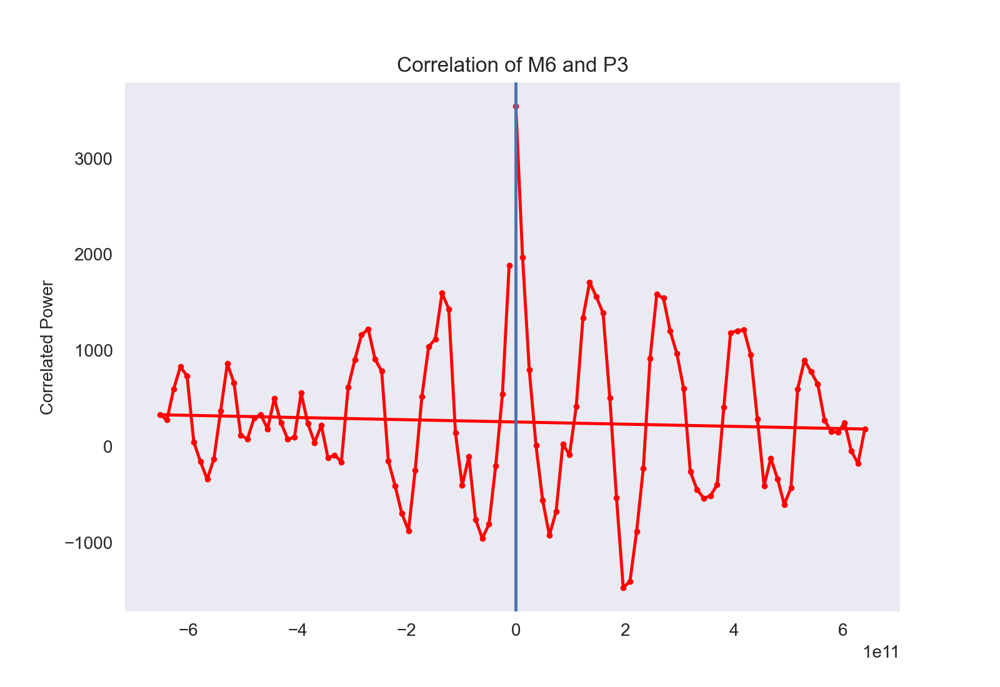

C:\Users\pkoll\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [73]:
## USING MY DATA WITH ORIGINAL PROCESS INSTEAD OF SCIPY
v1 = row_means_m6.dropna(dim = 'time')
v2 = row_means_p3.dropna(dim = 'time')


print(v1)
SIZE = len(v1)
#t = np.arange(SIZE)
t = v1.time
t_vals = v1.time.values.astype('float64') 
V12 = np.fft.fft(v1["I_1356_filt"]) * np.conj(np.fft.fft(v2["I_1356_filt"]))

print(len(V12))
print(len(v1["I_1356_filt"]))

print(V12)

#FFT SHIFT
fqs = np.fft.fftfreq(V12.size, np.median(np.diff(t_vals)))
taus = np.fft.fftfreq(fqs.size, fqs[1]-fqs[0])

plt.figure()
plt.plot(taus, np.fft.ifft(V12) / SIZE, '.-r')
plt.title('Correlation of M6 and P3')
plt.ylabel('Correlated Power')
#plt.xlabel('Time [ns]')
#plt.xlim(-100, 100)
plt.axvline(0)
plt.grid()
plt.show()




<IPython.core.display.Javascript object>


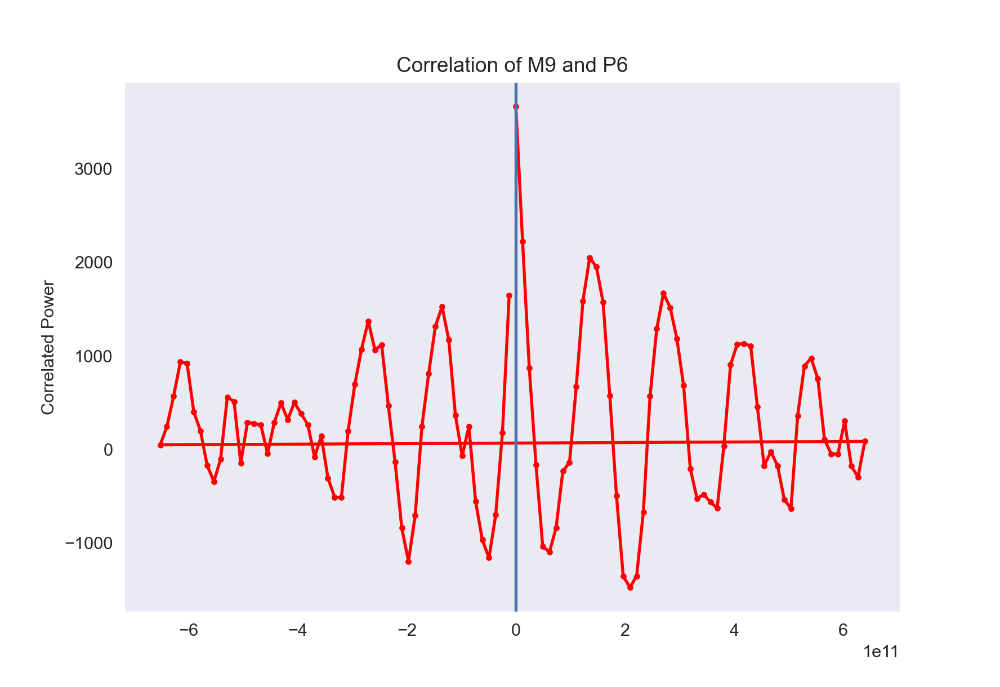

C:\Users\pkoll\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [18]:
orbit_data_m9 = orbits_finder(df_01_m9)[0]
orbit_data_p6 = orbits_finder(df_01_p6)[0]

orbit_data_m9['I_1356_filt'] = orbit_data_m9['I_1356'] - orbit_data_m9['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)
orbit_data_p6['I_1356_filt'] = orbit_data_p6['I_1356'] - orbit_data_p6['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)

row_means_m9 = orbit_data_m9.mean(dim = 'row')
row_means_p6 = orbit_data_p6.mean(dim = 'row')

v1 = row_means_m9.dropna(dim = 'time')
v2 = row_means_p6.dropna(dim = 'time')

SIZE = len(v1)
#t = np.arange(SIZE)
t = v1.time
t_vals = v1.time.values.astype('float64') 
V12 = np.fft.fft(v1["I_1356_filt"]) * np.conj(np.fft.fft(v2["I_1356_filt"]))


#FFT SHIFT
fqs = np.fft.fftfreq(V12.size, np.median(np.diff(t_vals)))
taus = np.fft.fftfreq(fqs.size, fqs[1]-fqs[0])

plt.figure()
plt.plot(taus, np.fft.ifft(V12) / SIZE, '.-r')
plt.title('Correlation of M9 and P6')
plt.ylabel('Correlated Power')
#plt.xlabel('Time [ns]')
#plt.xlim(-100, 100)
plt.axvline(0)
plt.grid()
plt.show()


In [19]:
def corr_fuvs(orbit1_data, orbit2_data, label1, label2):
    orbit1_data['I_1356_filt'] = orbit1_data['I_1356'] - orbit1_data['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)
    orbit2_data['I_1356_filt'] = orbit2_data['I_1356'] - orbit2_data['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)

    row_means_1 = orbit1_data.mean(dim = 'row')
    row_means_2 = orbit2_data.mean(dim = 'row')

    v1 = row_means_1.dropna(dim = 'time')
    v2 = row_means_2.dropna(dim = 'time')

    SIZE = len(v1)
    #t = np.arange(SIZE)
    t = v1.time
    t_vals = v1.time.values.astype('float64') 
    V12 = np.fft.fft(v1["I_1356_filt"]) * np.conj(np.fft.fft(v2["I_1356_filt"]))


    #FFT SHIFT
    fqs = np.fft.fftfreq(V12.size, np.median(np.diff(t_vals)))
    taus = np.fft.fftfreq(fqs.size, fqs[1]-fqs[0])

    plt.figure()
    plt.plot(taus, np.fft.ifft(V12) / SIZE, '.-r')
    plt.title('Correlation of $v_1$ = %s and $v_2 =$ %s' %(label1,label2))
    plt.ylabel('Correlated Power')
    #plt.xlabel('Time [ns]')
    #plt.xlim(-100, 100)
    plt.axvline(0)
    plt.grid()
    plt.show()

<IPython.core.display.Javascript object>


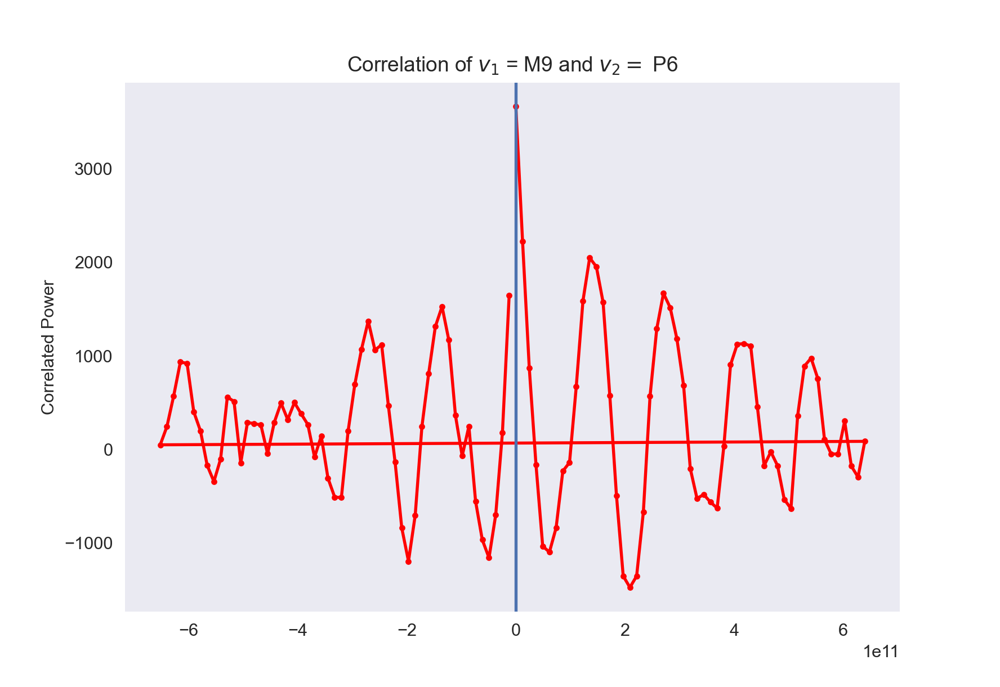

C:\Users\pkoll\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [20]:
corr_fuvs(orbits_finder(orbit_data_m9)[0], orbits_finder(orbit_data_p6)[0], "M9", "P6")

In [18]:
def corr_fuvs_and_fuvs(orbit1_data, orbit2_data, label1, label2):
    orbit1_data['I_1356_filt'] = orbit1_data['I_1356'] - orbit1_data['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)
    orbit2_data['I_1356_filt'] = orbit2_data['I_1356'] - orbit2_data['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)

    
 
    (fig, (ax1, ax2, ax3)) = plt.subplots(nrows=3, ncols=1, figsize = (10,15))

    # FUV 1
    vm = abs(orbit1_data.I_1356_filt).quantile(0.95) # Choose max of colorbar (i.e., contrast)
    pcm_1 = ax1.pcolormesh(pd.to_datetime(orbit1_data.time.values), orbit1_data.row, orbit1_data.I_1356_filt.T, cmap='plasma', vmin=-vm, vmax=vm)
    ax1.set_ylabel('row')
    fig.colorbar(pcm_1, ax = ax1, label='R')
    ax1.set_title('FUV 1356 brightness of Stripe %s' %(label1))
    #ax1.set_xticklabels(pd.to_datetime(orbit1_data.time.values), rotation=45)

    #plt.gca().autofmt_xdate()
    
    # FUV 2
    vm = abs(orbit2_data.I_1356_filt).quantile(0.95) # Choose max of colorbar (i.e., contrast)
    pcm_2 = ax2.pcolormesh(pd.to_datetime(orbit2_data.time.values), orbit2_data.row, orbit2_data.I_1356_filt.T, cmap='plasma', vmin=-vm, vmax=vm)
    ax2.set_ylabel('row')
    #ax2.colorbar(label='R')
    fig.colorbar(pcm_2, ax = ax2, label='R')
    ax2.set_title('FUV 1356 brightness of Stripe %s' %(label2))
    
    #plt.gca().autofmt_xdate()    
    #ax2.set_xticklabels(pd.to_datetime(orbit1_data.time.values), rotation=45)

    plt.tight_layout()
    
    #fuv_plots_smoothed(orbit1_data)
    #fuv_plots_smoothed(orbit2_data)
    
    row_means_1 = orbit1_data.mean(dim = 'row')
    row_means_2 = orbit2_data.mean(dim = 'row')

    v1 = row_means_1.dropna(dim = 'time')
    v2 = row_means_2.dropna(dim = 'time')

    SIZE = len(v1)
    #t = np.arange(SIZE)
    t = v1.time
    t_vals = v1.time.values.astype('float64') 
    V12 = np.fft.fft(v1["I_1356_filt"]) * np.conj(np.fft.fft(v2["I_1356_filt"]))


    #FFT NOT SHIFTED
    fqs = np.fft.fftfreq(V12.size, np.median(np.diff(t_vals)))
    taus = np.fft.fftfreq(fqs.size, fqs[1]-fqs[0])

    ax3.plot(taus, np.fft.ifft(V12) / SIZE, '.-r')
    ax3.set_title('Correlation of $v_1$ = %s and $v_2 =$ %s' %(label1,label2))
    ax3.set_ylabel('Correlated Power')
    #plt.xlabel('Time [ns]')
    #plt.xlim(-100, 100)
    ax3.axvline(0)
    ax3.grid()
    plt.show()

<IPython.core.display.Javascript object>


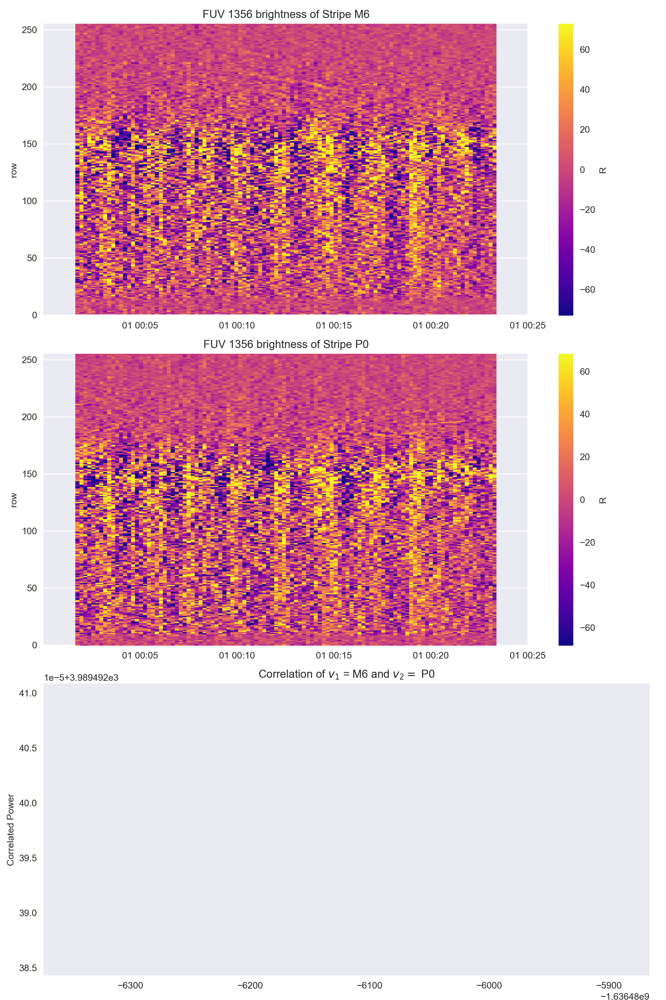

C:\Users\pkoll\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [19]:
corr_fuvs_and_fuvs(orbits_finder(orbits_finder(df_01_m6)[0])[0], orbits_finder(orbits_finder(df_01)[0])[0], "M6", "P0")

# Fix up correlation plots- fft shift and interpolate
# Plot of degree offset (3 deg increments) vs time offset (small delta off zero)

# Take FT of the correlation plot, see where the peak is to see if we can pull out frequencies

### INTERPOLATION AND FFT SHIFT

<IPython.core.display.Javascript object>


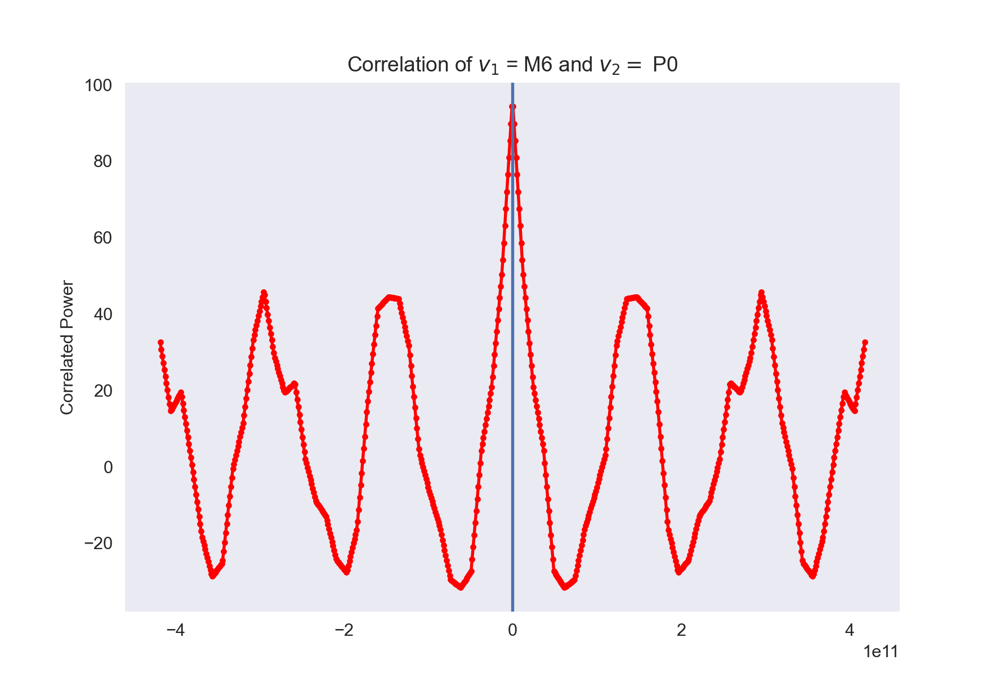

C:\Users\pkoll\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [117]:
orbit1_data = orbits_finder(orbits_finder(df_01_m6)[0])[0]
orbit2_data = orbits_finder(orbits_finder(df_01)[0])[0]
label1 = 'M6'
label2 = 'P0'

orbit1_data['I_1356_filt'] = orbit1_data['I_1356'] - orbit1_data['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)
orbit2_data['I_1356_filt'] = orbit2_data['I_1356'] - orbit2_data['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)

row_means_1 = orbit1_data.mean(dim = 'row')
row_means_2 = orbit2_data.mean(dim = 'row')

v1 = row_means_1.dropna(dim = 'time')
v2 = row_means_2.dropna(dim = 'time')


#SLICE OUT END FEATURES

# logic- divide data into 6ths, keep the central 4 6ths

SIZE = len(v1["I_1356_filt"])

lim_val = int(SIZE/6)


time_start = v1['time'].isel(time=lim_val).values
time_end =  v1['time'].isel(time=lim_val * 5).values

v1 = v1.sel(time=slice(time_start, time_end))
v2 = v1.sel(time=slice(time_start, time_end))

SIZE = len(v1["I_1356_filt"])

#t = np.arange(SIZE)
t = v1.time
t_vals = v1.time.values.astype('float64') 
V12 = np.fft.fft(v1["I_1356_filt"]) * np.conj(np.fft.fft((v2["I_1356_filt"])))

fqs = np.fft.fftfreq(V12.size, np.median(np.diff(t_vals)))
taus = np.fft.fftfreq(fqs.size, fqs[1]-fqs[0])

#FFT SHIFT
V12_shifted = np.fft.fftshift((np.fft.ifft(V12)) / SIZE)
taus_shifted = np.fft.fftshift(taus)

#INTERPOLATE
from scipy.interpolate import interp1d

interpolator = interp1d(taus_shifted, V12_shifted, kind='linear', fill_value='extrapolate')
taus_interp = np.linspace(np.min(taus_shifted), np.max(taus_shifted), 10*len(taus_shifted))
V12_interp = interpolator(taus_interp)

# PLOT
plt.figure()
plt.plot(taus_interp, V12_interp, '.-r')
plt.title('Correlation of $v_1$ = %s and $v_2 =$ %s' %(label1,label2))
plt.ylabel('Correlated Power')
#plt.xlabel('Time [ns]')
#plt.xlim(-100, 100)
plt.axvline(0)
plt.grid()
plt.show()

In [ ]:
v1.sel

In [70]:
# Find Peak and Offset


557325779.0368652

Difference from 0: (108.13031536458828-2.318273576468514e-16j)


<IPython.core.display.Javascript object>


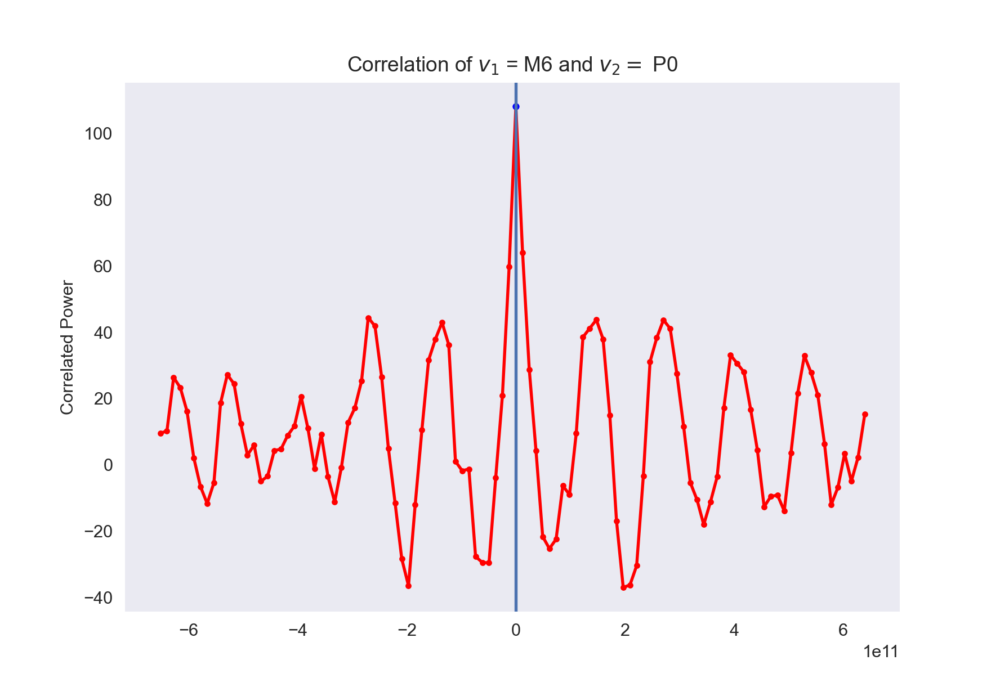

C:\Users\pkoll\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [69]:
orbit1_data = orbits_finder(orbits_finder(df_01_m6)[0])[0]
orbit2_data = orbits_finder(orbits_finder(df_01)[0])[0]
label1 = 'M6'
label2 = 'P0'

orbit1_data['I_1356_filt'] = orbit1_data['I_1356'] - orbit1_data['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)
orbit2_data['I_1356_filt'] = orbit2_data['I_1356'] - orbit2_data['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)

sel_rows_1 = orbit1_data.isel(row=slice(0, 126))
sel_rows_2 = orbit2_data.isel(row=slice(0, 126))

row_means_1 = sel_rows_1.mean(dim = 'row')
row_means_2 = sel_rows_2.mean(dim = 'row')

# row_means_1 = orbit1_data.mean(dim = 'row')
# row_means_2 = orbit2_data.mean(dim = 'row')

v1 = row_means_1.dropna(dim = 'time')
v2 = row_means_2.dropna(dim = 'time')

SIZE = len(v1["I_1356_filt"])
#t = np.arange(SIZE)
t = v1.time
t_vals = v1.time.values.astype('float64') 

#INTERPOLATE
from scipy.interpolate import interp1d

interp_func_v1 = interp1d(t_vals, v1["I_1356_filt"], kind='linear', fill_value='extrapolate')
interp_func_v2 = interp1d(t_vals, v2["I_1356_filt"], kind='linear', fill_value='extrapolate')

t_interp = np.linspace(t_vals[0], t_vals[-1], SIZE)
v1_interp = interp_func_v1(t_interp)
v2_interp = interp_func_v2(t_interp)


V12 = np.fft.fft(v1_interp) * np.conj(np.fft.fft((v2_interp)))
fqs = np.fft.fftfreq(V12.size, np.median(np.diff(t_vals)))
taus = np.fft.fftfreq(fqs.size, fqs[1]-fqs[0])

#FFT SHIFT
V12_shifted = np.fft.fftshift((np.fft.ifft(V12)) / SIZE)
taus_shifted = np.fft.fftshift(taus)


#MAX and OFFSET
max_index = np.argmax(np.abs(V12_shifted))
# Calculate difference from 0
max_difference = V12_shifted[max_index] - 0
print("Difference from 0:", max_difference)

# PLOT
plt.figure()
plt.plot(taus_shifted, V12_shifted, '.-r')
plt.title('Correlation of $v_1$ = %s and $v_2 =$ %s' %(label1,label2))
plt.plot(taus_shifted[max_index], V12_shifted[max_index], 'bo', markersize=4)  # Emphasize max point
plt.ylabel('Correlated Power')
#plt.xlabel('Time [ns]')
#plt.xlim(-100, 100)
plt.axvline(0)
plt.grid()
plt.show()

In [75]:
def correlations_interpolated(orbit1_data,orbit2_data,label1,label2):
    orbit1_data['I_1356_filt'] = orbit1_data['I_1356'] - orbit1_data['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)
    orbit2_data['I_1356_filt'] = orbit2_data['I_1356'] - orbit2_data['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)

    # SLICE OUT ROWS ABOVE ROW 125 TO ENSURE WE DON'T GET ANY ARTIFACTS
    
    sel_rows_1 = orbit1_data.isel(row=slice(0, 126))
    sel_rows_2 = orbit2_data.isel(row=slice(0, 126))

    row_means_1 = sel_rows_1.mean(dim = 'row')
    row_means_2 = sel_rows_2.mean(dim = 'row')

    
#     row_means_1 = orbit1_data.mean(dim = 'row')
#     row_means_2 = orbit2_data.mean(dim = 'row')

    v1 = row_means_1.dropna(dim = 'time')
    v2 = row_means_2.dropna(dim = 'time')

    SIZE = len(v1["I_1356_filt"])
    #t = np.arange(SIZE)
    t = v1.time
    t_vals = v1.time.values.astype('float64') 

    #INTERPOLATE
    from scipy.interpolate import interp1d

    interp_func_v1 = interp1d(t_vals, v1["I_1356_filt"], kind='linear', fill_value='extrapolate')
    interp_func_v2 = interp1d(t_vals, v2["I_1356_filt"], kind='linear', fill_value='extrapolate')

    t_interp = np.linspace(t_vals[0], t_vals[-1], SIZE*1000)
    v1_interp = interp_func_v1(t_interp)
    v2_interp = interp_func_v2(t_interp)


    V12 = np.fft.fft(v1_interp) * np.conj(np.fft.fft((v2_interp)))
    fqs = np.fft.fftfreq(V12.size, np.median(np.diff(t_vals)))
    taus = np.fft.fftfreq(fqs.size, fqs[1]-fqs[0])

    #FFT SHIFT
    V12_shifted = np.fft.fftshift((np.fft.ifft(V12)) / SIZE) #sanity check this 
    taus_shifted = np.fft.fftshift(taus)
    
    #MAX and OFFSET
    max_index = np.argmax(np.abs(V12_shifted)) # check this with the shifted and the unshifted 
    print('index',max_index)
    
    # Calculate difference from 0
    max_difference = taus_shifted[max_index] - 0
    print('xval',taus_shifted[max_index])
    print("Difference from 0:", max_difference*1e-9)
    #print()



    # PLOT
    plt.figure()
    plt.plot(taus_shifted, V12_shifted, '.-r')
    plt.plot(taus_shifted[max_index], V12_shifted[max_index], 'bo', markersize=4)  # Emphasize max point
    plt.title('Correlation of $v_1$ = %s and $v_2 =$ %s' %(label1,label2))
    plt.ylabel('Correlated Power')
    #plt.xlabel('Time [ns]')
    #plt.xlim(-100, 100)
    plt.axvline(0)
    plt.grid()
    plt.show()


In [80]:
def UNSHIFTED_corrs(orbit1_data,orbit2_data,label1,label2):
    orbit1_data['I_1356_filt'] = orbit1_data['I_1356'] - orbit1_data['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)
    orbit2_data['I_1356_filt'] = orbit2_data['I_1356'] - orbit2_data['I_1356'].rolling(time=17, center=True).mean() # Remove ~3.5 minute (17-sample) rolling mean (FUV samples @ 12 sec)

    # SLICE OUT ROWS ABOVE ROW 125 TO ENSURE WE DON'T GET ANY ARTIFACTS
    
    sel_rows_1 = orbit1_data.isel(row=slice(0, 126))
    sel_rows_2 = orbit2_data.isel(row=slice(0, 126))

    row_means_1 = sel_rows_1.mean(dim = 'row')
    row_means_2 = sel_rows_2.mean(dim = 'row')

    
#     row_means_1 = orbit1_data.mean(dim = 'row')
#     row_means_2 = orbit2_data.mean(dim = 'row')

    v1 = row_means_1.dropna(dim = 'time')
    v2 = row_means_2.dropna(dim = 'time')

    SIZE = len(v1["I_1356_filt"])
    #t = np.arange(SIZE)
    t = v1.time
    t_vals = v1.time.values.astype('float64') 

    #INTERPOLATE
    from scipy.interpolate import interp1d

    interp_func_v1 = interp1d(t_vals, v1["I_1356_filt"], kind='linear', fill_value='extrapolate')
    interp_func_v2 = interp1d(t_vals, v2["I_1356_filt"], kind='linear', fill_value='extrapolate')

    t_interp = np.linspace(t_vals[0], t_vals[-1], SIZE*1000)
    v1_interp = interp_func_v1(t_interp)
    v2_interp = interp_func_v2(t_interp)


    V12 = np.fft.fft(v1_interp) * np.conj(np.fft.fft((v2_interp)))
    fqs = np.fft.fftfreq(V12.size, np.median(np.diff(t_vals)))
    taus = np.fft.fftfreq(fqs.size, fqs[1]-fqs[0])

    #FFT SHIFT
    #V12_shifted = np.fft.fftshift((np.fft.ifft(V12)) / SIZE) #sanity check this 
   # taus_shifted = np.fft.fftshift(taus)
    
    #MAX and OFFSET
    max_index = np.argmax(np.abs(V12)) # check this with the shifted and the unshifted 
    print('index',max_index)
    
    # Calculate difference from 0
    max_difference = taus[max_index] - 0
    print('xval',taus[max_index])
    print("Difference from 0:", max_difference*1e-9)
    #print()



    # PLOT
    plt.figure()
    plt.plot(taus,  np.fft.ifft(V12), '.-r')
    plt.plot(taus[max_index], V12[max_index], 'bo', markersize=4)  # Emphasize max point
    plt.title('Correlation of $v_1$ = %s and $v_2 =$ %s' %(label1,label2))
    plt.ylabel('Correlated Power')
    #plt.xlabel('Time [ns]')
    #plt.xlim(-100, 100)
    plt.axvline(0)
    plt.grid()
    plt.show()


In [76]:
m3 = orbits_finder(orbits_finder(df_01_m3)[0])[0]
m3_label = 'M3'
m6 = orbits_finder(orbits_finder(df_01_m6)[0])[0]
m6_label = 'M6'
m9 = orbits_finder(orbits_finder(df_01_m9)[0])[0]
m9_label = 'M9'


p0 = orbits_finder(orbits_finder(df_01)[0])[0]
p0_label = 'P0'
p3 = orbits_finder(orbits_finder(df_01_p3)[0])[0]
p3_label = 'P3'
p6 = orbits_finder(orbits_finder(df_01_p6)[0])[0]
p6_label = 'P6'


index 53025
xval 307400000000.0
Difference from 0: 307.40000000000003


<IPython.core.display.Javascript object>


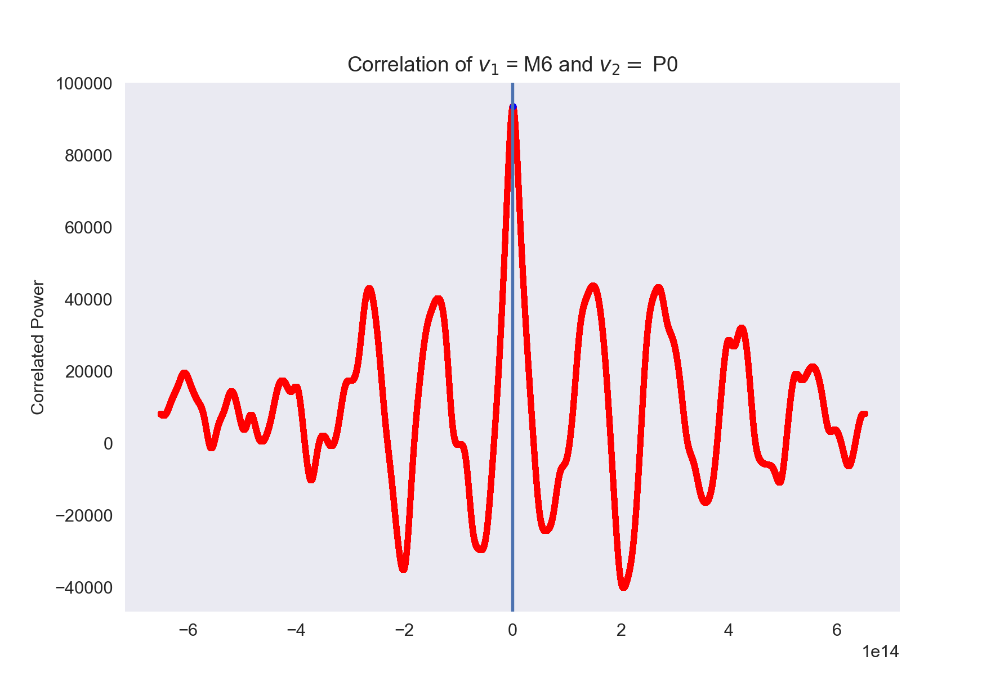

C:\Users\pkoll\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [77]:
correlations_interpolated(m6,p0,m6_label,p0_label)

In [83]:
correlations(m6,p0,m6_label,p0_label)

<xarray.DataArray 'time' (time: 122)>
array(['2020-01-01T00:00:07.713000000', '2020-01-01T00:00:20.017000000',
       '2020-01-01T00:00:32.313000000', '2020-01-01T00:00:44.618000000',
       '2020-01-01T00:00:56.914000000', '2020-01-01T00:01:09.217000000',
       '2020-01-01T00:01:21.513000000', '2020-01-01T00:01:33.818000000',
       '2020-01-01T00:01:46.114000000', '2020-01-01T00:01:58.417000000',
       '2020-01-01T00:02:10.713000000', '2020-01-01T00:02:23.017000000',
       '2020-01-01T00:02:35.313000000', '2020-01-01T00:02:47.618000000',
       '2020-01-01T00:02:59.914000000', '2020-01-01T00:03:12.217000000',
       '2020-01-01T00:03:24.513000000', '2020-01-01T00:03:36.818000000',
       '2020-01-01T00:03:49.114000000', '2020-01-01T00:04:01.417000000',
       '2020-01-01T00:04:13.713000000', '2020-01-01T00:04:26.017000000',
       '2020-01-01T00:04:38.312000000', '2020-01-01T00:04:50.617000000',
       '2020-01-01T00:05:02.913000000', '2020-01-01T00:05:15.217000000',
       '2020-

TypeError: cannot directly convert an xarray.Dataset into a numpy array. Instead, create an xarray.DataArray first, either with indexing on the Dataset or by invoking the `to_array()` method.

Difference from 0: 86.072


<IPython.core.display.Javascript object>


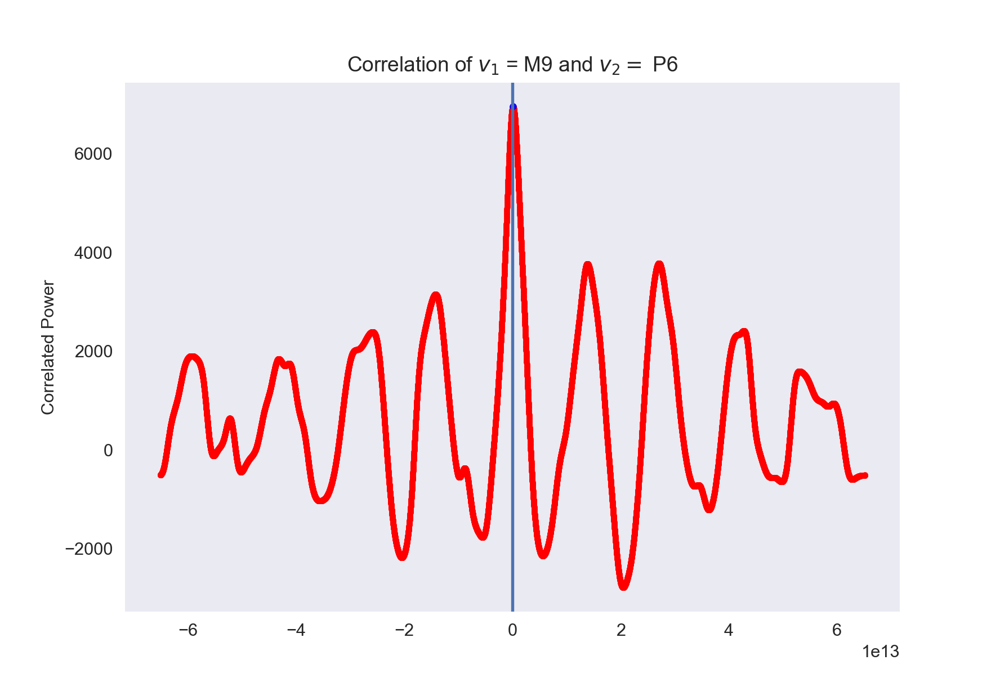

C:\Users\pkoll\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [63]:
correlations_interpolated(m9,p6,m9_label,p6_label)

In [ ]:
# spacecraft at 600 km

  ### TESTING SHIFTS (TAU)

##### A SHIFT TO THE LEFT (a positive tau a), correlation peak is negative

<IPython.core.display.Javascript object>


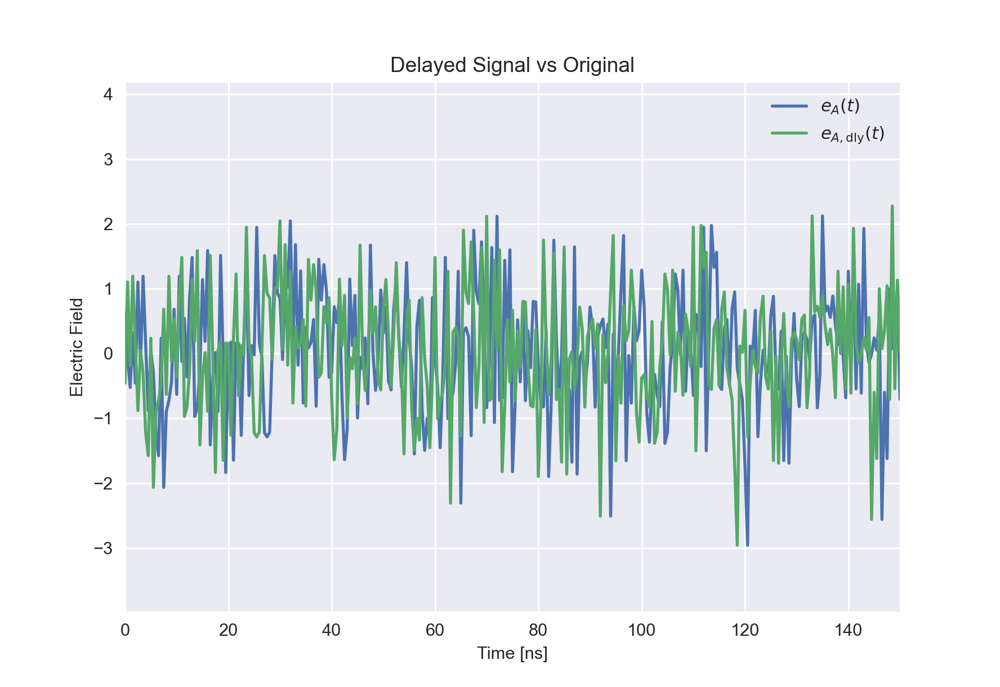

In [100]:
## TEST DATA

SIZE = 10000
t = np.arange(SIZE) * 0.5e-9 # time step of 0.5 us = 1/(2 MHz)
e_A = np.random.normal(size=SIZE)

fqs = np.fft.fftfreq(t.size, np.median(np.diff(t)))
tau_A = 2e-9

# Using the convolution theorem to introduce a geometric delay
e_A_dly = np.fft.ifft(np.fft.fft(e_A) * np.exp(2j*np.pi*tau_A*fqs)).real

v1 = e_A_dly 
v2 = e_A

plt.figure()
plt.plot(t * 1e9, e_A, label=r"$e_A(t)$")
plt.plot(t * 1e9, e_A_dly, label=r"$e_{A,{\rm dly}}(t)$")
plt.title("Delayed Signal vs Original")
plt.ylabel('Electric Field')
plt.xlabel('Time [ns]')
plt.xlim(0,150)
_ = plt.legend()
plt.show()

<IPython.core.display.Javascript object>


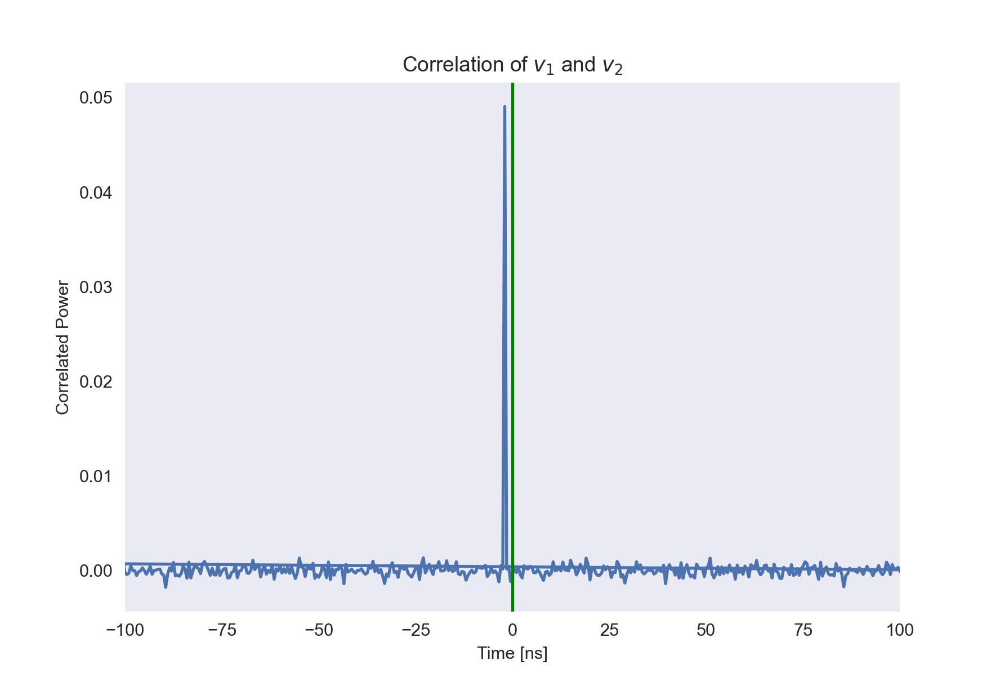

In [101]:
v1.shape = (20, 500) # Why are we reshaping it here? It's an array of 10000, are we just doing this arbitrarily?
v2.shape = (20, 500)
V12 = np.fft.fft(v1) * np.conj(np.fft.fft(v2))
V12 = np.mean(V12, axis=0)
fqs = np.fft.fftfreq(V12.size, np.median(np.diff(t)))

taus = np.fft.fftfreq(fqs.size, fqs[1]-fqs[0])
plt.figure()
plt.plot(taus * 1e9, np.fft.ifft(V12) / SIZE)
plt.title('Correlation of $v_1$ and $v_2$')
plt.ylabel('Correlated Power')
plt.xlabel('Time [ns]')
plt.axvline(0, color = 'g')
plt.xlim(-100, 100)
plt.grid()

##### A SHIFT TO THE RIGHT (negative tau A),  correlation peak is positive

<IPython.core.display.Javascript object>


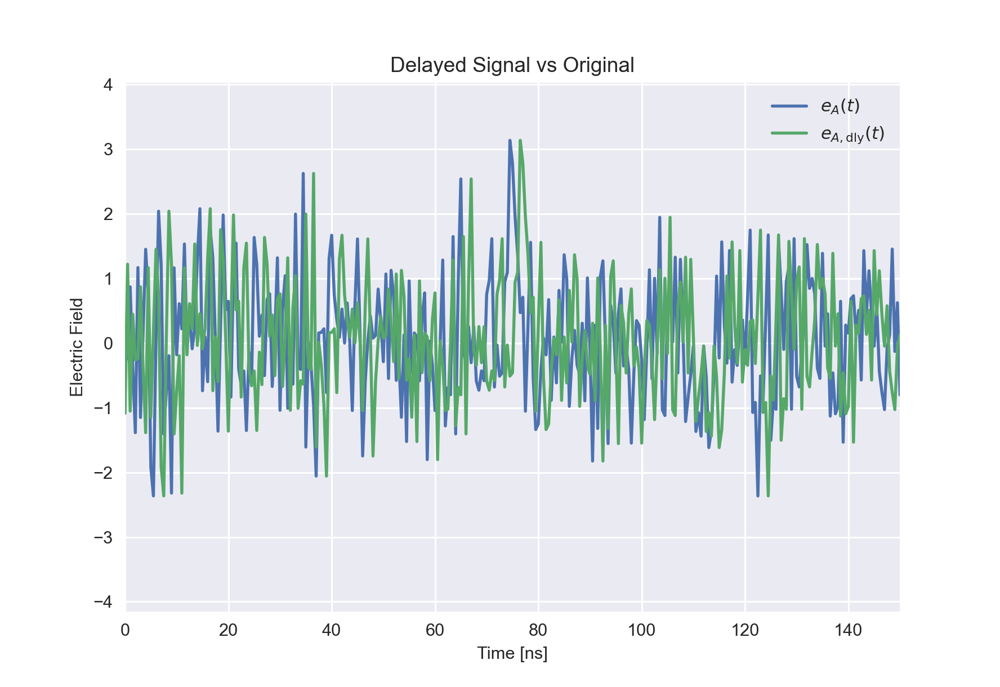

In [102]:
## TEST DATA

SIZE = 10000
t = np.arange(SIZE) * 0.5e-9 # time step of 0.5 us = 1/(2 MHz)
e_A = np.random.normal(size=SIZE)

fqs = np.fft.fftfreq(t.size, np.median(np.diff(t)))
tau_A = -2e-9

# Using the convolution theorem to introduce a geometric delay
e_A_dly = np.fft.ifft(np.fft.fft(e_A) * np.exp(2j*np.pi*tau_A*fqs)).real

v1 = e_A_dly 
v2 = e_A

plt.figure()
plt.plot(t * 1e9, e_A, label=r"$e_A(t)$")
plt.plot(t * 1e9, e_A_dly, label=r"$e_{A,{\rm dly}}(t)$")
plt.title("Delayed Signal vs Original")
plt.ylabel('Electric Field')
plt.xlabel('Time [ns]')
plt.xlim(0,150)
_ = plt.legend()
plt.show()

<IPython.core.display.Javascript object>


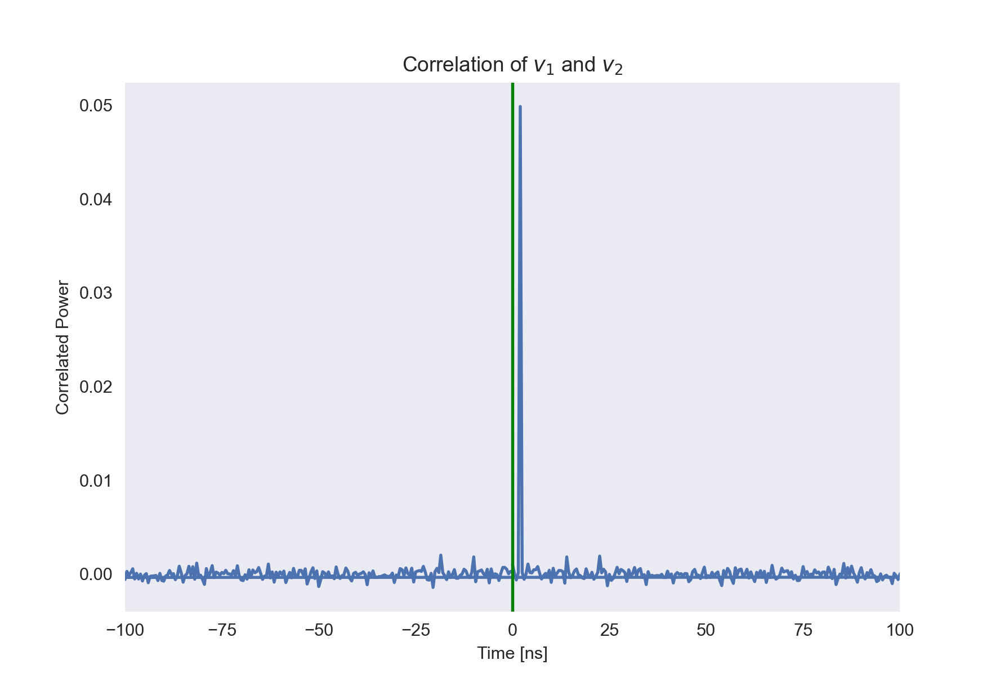

In [103]:
v1.shape = (20, 500) # Why are we reshaping it here? It's an array of 10000, are we just doing this arbitrarily?
v2.shape = (20, 500)
V12 = np.fft.fft(v1) * np.conj(np.fft.fft(v2))
V12 = np.mean(V12, axis=0)
fqs = np.fft.fftfreq(V12.size, np.median(np.diff(t)))

taus = np.fft.fftfreq(fqs.size, fqs[1]-fqs[0])
plt.figure()
plt.plot(taus * 1e9, np.fft.ifft(V12) / SIZE)
plt.title('Correlation of $v_1$ and $v_2$')
plt.ylabel('Correlated Power')
plt.xlabel('Time [ns]')
plt.axvline(0, color = 'g')
plt.xlim(-100, 100)
plt.grid()

### ROW VS DISTANCE RELATION

  ### TESTING OTHER SHENANIGANS

In [82]:
## USING MY DATA WITH ORIGINAL PROCESS INSTEAD OF SCIPY

def correlations(v1,v2,label1,label2):
    SIZE = len(v1)
    #t = np.arange(SIZE)
    t = v1.time
    t_vals = v1.time.values.astype('float64') 
    print(t)
    print(t_vals)
    
    V12 = np.fft.fft(v1) * np.conj(np.fft.fft(v2))
    
    fqs = np.fft.fftfreq(V12.size, np.median(np.diff(t_vals)))
    
    taus = np.fft.fftfreq(fqs.size, fqs[1]-fqs[0])
    
    plt.figure()
    plt.plot(taus, np.fft.ifft(V12) / SIZE, '-r')
    plt.title('Correlation of $v_1$ = %s and $v_2 =$ %s' %(label1,label2))
    plt.ylabel('Correlated Power')
    #plt.xlabel('Time [ns]')
    #plt.xlim(-100, 100)
    plt.axvline(0)
    plt.grid()
    plt.show()


<xarray.DataArray 'time' (time: 325)>
array(['2020-01-01T01:04:29.421000000', '2020-01-01T01:04:41.717000000',
       '2020-01-01T01:04:54.020000000', ..., '2020-01-01T02:18:53.069000000',
       '2020-01-01T02:19:05.374000000', '2020-01-01T02:19:17.670000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2020-01-01T01:04:29.421000 ... 2020-01-01T...
[1.57784067e+18 1.57784068e+18 1.57784069e+18 1.57784071e+18
 1.57784072e+18 1.57784073e+18 1.57784074e+18 1.57784076e+18
 1.57784077e+18 1.57784078e+18 1.57784079e+18 1.57784080e+18
 1.57784082e+18 1.57784083e+18 1.57784084e+18 1.57784085e+18
 1.57784087e+18 1.57784088e+18 1.57784089e+18 1.57784090e+18
 1.57784092e+18 1.57784093e+18 1.57784094e+18 1.57784095e+18
 1.57784096e+18 1.57784098e+18 1.57784099e+18 1.57784100e+18
 1.57784101e+18 1.57784103e+18 1.57784104e+18 1.57784105e+18
 1.57784106e+18 1.57784108e+18 1.57784109e+18 1.57784110e+18
 1.57784111e+18 1.57784113e+18 1.57784114e+18 1.57784115e+18
 1.

<IPython.core.display.Javascript object>


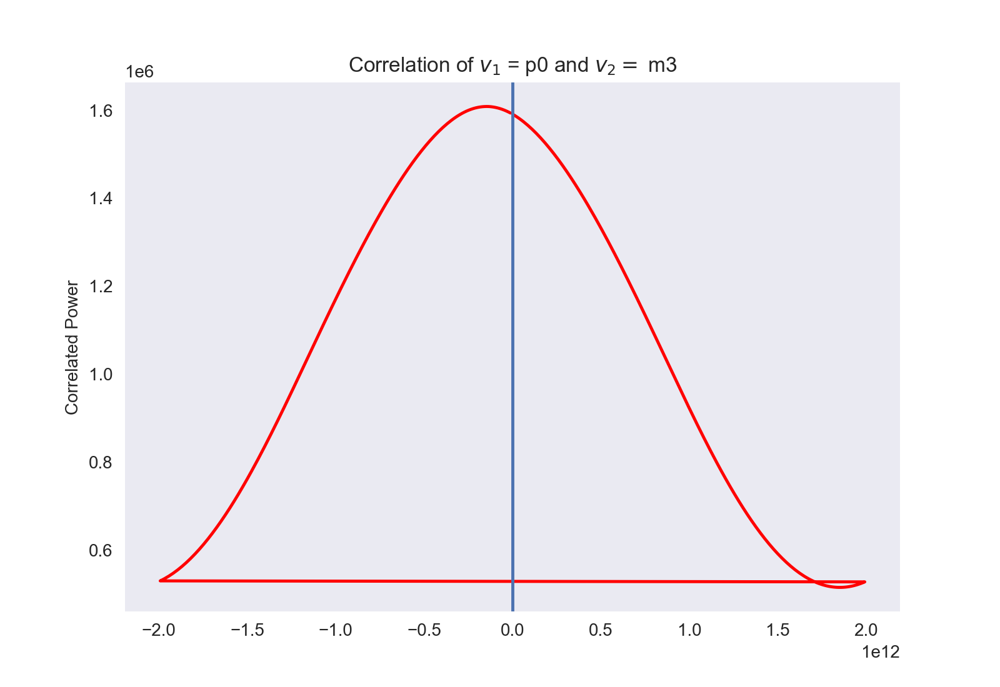

In [66]:
correlations(p0,m3,'p0','m3')

In [54]:
p0 = single_orb(p_0_all_orbits,1)[1]
m3 = single_orb(m_3_all_orbits,1)[1]
m6 = single_orb(m_6_all_orbits,1)[1]
p3 = single_orb(p_3_all_orbits,1)[1]


<IPython.core.display.Javascript object>


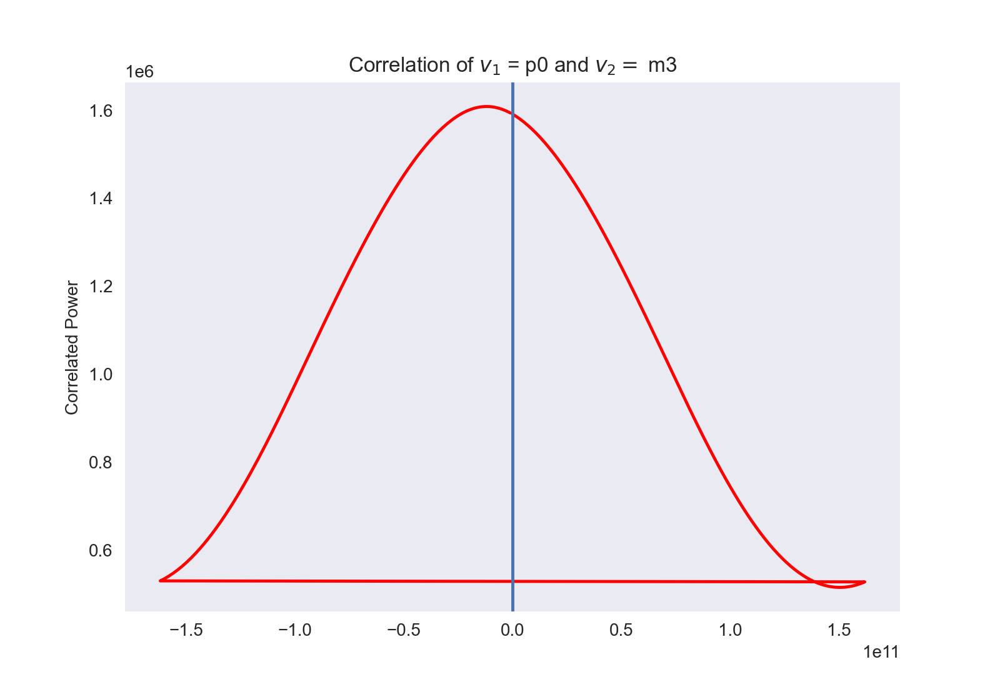

C:\Users\pkoll\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [55]:
correlations(p0,m3,'p0','m3')

<IPython.core.display.Javascript object>


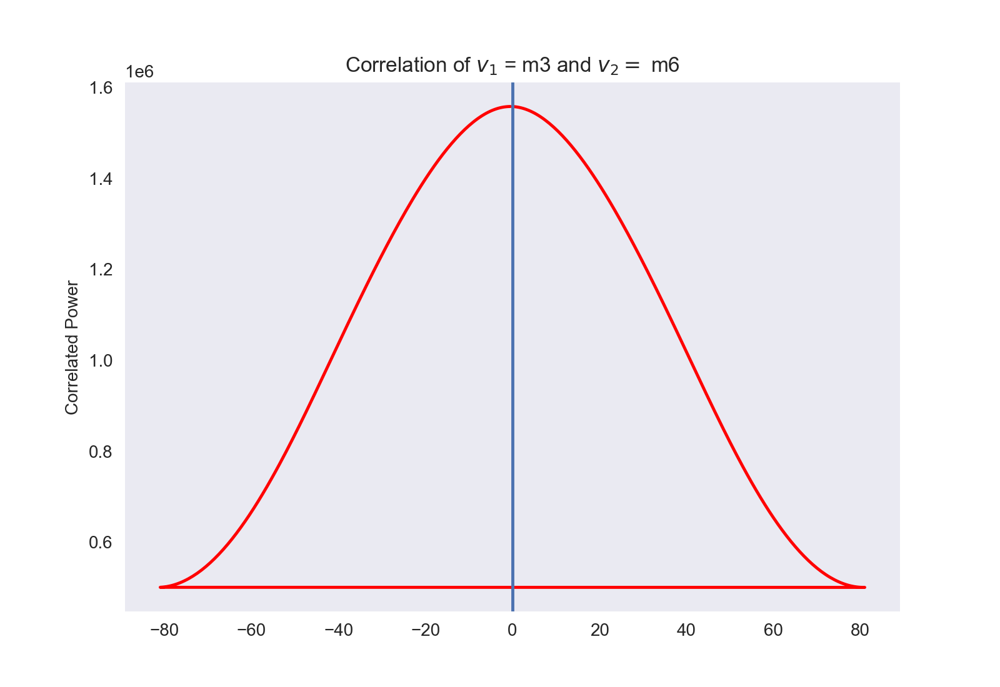

In [38]:
correlations(m3,m6,'m3','m6')

<IPython.core.display.Javascript object>


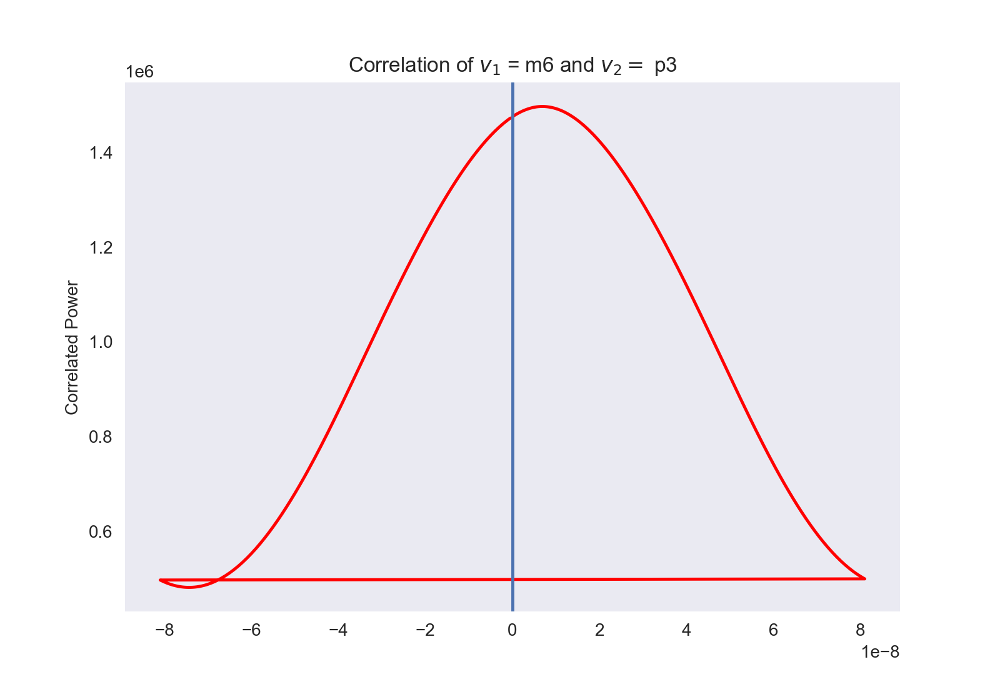

In [34]:
correlations(m6,p3,'m6','p3')

In [ ]:
## USING ON MEAN FUV DATA

# YOU HAVE TO DO ALL THIS ON FILT DATA THIS IS NOT OKAY
  dsf_plot = orbit_data.rolling(row=7, center=True).mean()
    orbit_data['I_1356_filt'] = orbit_data['I_1356'] - orbit_data['I_1356'].rolling(time=17, center=True).mean()

### INTERPOLATION

In [ ]:
taus = np.fft.fftfreq(fqs.size, fqs[1]-fqs[0])
plt.figure()
plt.plot(taus * 1e9, np.fft.ifft(V12) / SIZE)
plt.title('Correlation of $v_1$ and $v_2$')
plt.ylabel('Correlated Power')
plt.xlabel('Time [ns]')
plt.xlim(-100, 100)
plt.grid()

In [ ]:
p0_x= single_orb(p_0_all_orbits,1)[0]
po_y = single_orb(p_0_all_orbits,1)[1]
len(po_y) 


In [ ]:
#average the rows and plot the 6 lines on a singular plot
# x axis here would be time

#another plot could be a x axis as position
#either use the anc file and use the longitude, or use the degree shifts as a representation of that distance
# craft is moving at 7.1 km/s

#l

# upsample (interpolation), then run lagged cross correlation
# align the stripes next to each other and see the correlation between each pair of them 